In [ ]:
# Load drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from pandas import read_csv
import numpy as np
from numpy import arange
import matplotlib.pyplot as plt
from tifffile import *
from glob import glob
!pip install rasterio
!pip install earthpy
import rasterio

import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import linear_model
import statsmodels.api as sm
from matplotlib.patches import Patch
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as mcolors

from matplotlib.colors import Normalize
from scipy.interpolate import interpn
import rasterio as rio
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import plotly.graph_objects as go

# Import libraries
import pandas as pd
from pandas import read_csv
import numpy as np
from numpy import arange
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from scipy.interpolate import interpn
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.inspection import permutation_importance

# Import Python 3's print function and division
from __future__ import print_function, division

# Import GDAL, NumPy, and matplotlib
from osgeo import gdal, gdal_array
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from osgeo import gdal
import os
import glob
import numpy as np
import re
import matplotlib.pyplot as plt

from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, confusion_matrix, classification_report)


import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import xgboost as xgb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 53.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 15.9 MB/s eta 0:00:00


In [ ]:
# import matplotlib.pyplot as plt
# plt.rcParams['font.family'] = 'serif'
# plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']

In [ ]:
def calculate_metrics(depth, reference):
    # Mask NaN values
    mask = ~np.isnan(depth) & ~np.isnan(reference) & (depth <= 0)
    depth = depth[mask]
    reference = reference[mask]
    # Calculate RMSE, MAE, and R2
    rmse = mean_squared_error(reference, depth, squared=False)
    mae = np.mean(abs(reference - depth))
    r2 = r2_score(reference, depth)

    return rmse, mae, r2

In [ ]:
def calculate_metrics(depth, reference):
    # Mask NaN values
    mask = ~np.isnan(depth) & ~np.isnan(reference) & (depth <= 0)
    depth = depth[mask]
    reference = reference[mask]
    # Calculate RMSE, MAE, and R2
    rmse = mean_squared_error(reference, depth, squared=False)
    mae = np.mean(abs(reference - depth))
    r2 = r2_score(reference, depth)

    # Create dataframe with predictions and reference values
    df = pd.DataFrame({'Reference': reference, 'Predicted': depth})
    df2 = df[df['Reference'] < 0]
    df2 = df2[df2['Predicted'] > -50]
    df2 = df2[df2['Predicted'] < 0]
    df3 = df2.reset_index(drop=True)
    df3['Error'] = df3['Predicted'] - df3['Reference']

    return rmse, mae, r2, df3

# 1: Stumpf

## 1: Stumpf unlimited

In [ ]:
# Sentinel-2 image:
with rasterio.open('/content/drive/MyDrive/GEE_composites/median_reflectance.tif') as src:
    image = src.read()

In [ ]:
reference = image[-1,:,:]
reference[reference > 0] = np.nan
reference[reference == 0] = np.nan
reference[reference < - 100] = np.nan

blue = image[1,:,:]
blue = blue.astype(float)
blue[blue==0] = np.nan # set 0 to NaN

green = image[2,:,:]
green = green.astype(float)
green[green==0] = np.nan # set 0 to NaN

red = image[3,:,:]
red = red.astype(float)
red[red==0] = np.nan # set 0 to NaN

nir = image[4,:,:]
nir = nir.astype(float)
nir[nir==0] = np.nan # set 0 to NaN

blue_deglint = blue
green_deglint = green
red_deglint = red

blue_DOS =  blue_deglint - np.nanmin(blue_deglint.flatten())
green_DOS = green_deglint - np.nanmin(green_deglint.flatten())
red_DOS = red_deglint - np.nanmin(red_deglint.flatten())

z = np.log(1000*green_DOS)/np.log(1000*blue_DOS)
z[z < - 30] = np.nan

<ipython-input-7-2f9fedba3507>:30: RuntimeWarning: divide by zero encountered in log
  z = np.log(1000*green_DOS)/np.log(1000*blue_DOS)
<ipython-input-7-2f9fedba3507>:30: RuntimeWarning: invalid value encountered in true_divide
  z = np.log(1000*green_DOS)/np.log(1000*blue_DOS)


In [ ]:
np.random.seed(42)

z_flatten = z.flatten() # Flatten Z values
df_z = pd.DataFrame(z_flatten) # Put Z values in dataframe
reference2 = reference.flatten() # Flatten reference lidar data
df_reference=pd.DataFrame(reference2) # Put reference data in dataframe
#df_reference  = df_reference[df_reference > - 15]
df = pd.concat([df_reference, df_z], axis=1) # Concatenate both dataframes
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Z']
df3 = df2.reset_index(drop=True)

bin1 = df3.loc[(df3['Reference']< 0) & (df3['Reference']> -2)]
bin1s = bin1.sample(n = 10)
bin2 = df3.loc[(df3['Reference']< -2) & (df3['Reference']> -4)]
bin2s = bin2.sample(n = 10)
bin3 = df3.loc[(df3['Reference']< -4) & (df3['Reference']> -6)]
bin3s = bin3.sample(n = 10)
bin4 = df3.loc[(df3['Reference']< -6) & (df3['Reference']> -8)]
bin4s = bin4.sample(n = 10)
bin5 = df3.loc[(df3['Reference']< -8) & (df3['Reference']> -10)]
bin5s = bin5.sample(n = 10)
bin6 = df3.loc[(df3['Reference']< -10) & (df3['Reference']> -12)]
bin6s = bin6.sample(n = 10)
bin7 = df3.loc[(df3['Reference']< -12) & (df3['Reference']> -14)]
bin7s = bin7.sample(n = 10)
bin8 = df3.loc[(df3['Reference']< -14) & (df3['Reference']> -16)]
bin8s = bin8.sample(n = 10)
bin9 = df3.loc[(df3['Reference']< -16) & (df3['Reference']> -18)]
bin9s = bin9.sample(n = 10)
bin10 = df3.loc[(df3['Reference']< -18) & (df3['Reference']> -20)]
bin10s = bin10.sample(n = 10)
bin11 = df3.loc[(df3['Reference']< -20) & (df3['Reference']> -22)]
bin11s = bin11.sample(n = 10)
bin12 = df3.loc[(df3['Reference']< -22) & (df3['Reference']> -24)]
bin12s = bin12.sample(n = 10)
bin13 = df3.loc[(df3['Reference']< -24) & (df3['Reference']> -26)]
bin13s = bin13.sample(n = 10)
bin14 = df3.loc[(df3['Reference']< -26) & (df3['Reference']> -28)]
bin14s = bin14.sample(n = 10)
bin15 = df3.loc[(df3['Reference']< -28) & (df3['Reference']> -30)]
bin15s = bin15.sample(n = 10)
bin16 = df3.loc[(df3['Reference']< -30) & (df3['Reference']> -32)]
bin16s = bin16.sample(n = 10)
bin17 = df3.loc[(df3['Reference']< -32) & (df3['Reference']> -34)]
bin17s = bin17.sample(n = 10)
bin18 = df3.loc[(df3['Reference']< -34) & (df3['Reference']> -36)]
bin18s = bin18.sample(n = 10)
bin19 = df3.loc[(df3['Reference']< -36) & (df3['Reference']> -38)]
bin19s = bin19.sample(n = 10)
bin20 = df3.loc[(df3['Reference']< -38) & (df3['Reference']> -40)]
bin20s = bin20.sample(n = 10)
df_sample = pd.concat([bin1s,bin2s,bin3s,bin4s,bin5s,bin6s,bin7s,bin8s,bin9s,bin10s,bin11s,bin12s,bin13s,bin14s,bin15s])

# Linear regression to calculate k0 and k1:
model = sm.OLS(df_sample.Reference, sm.add_constant(df_sample.Z)).fit()
print_model = model.summary()
print(print_model)

# Scoring metrics
df3['Depth'] = df3['Z'] * model.params[1] + model.params[0]
depth = z*model.params[1] + model.params[0]
df3['Depth'] = df3['Depth'][df3['Depth'] < 0]
df3['Depth'] = df3['Depth'][df3['Depth'] > -50]

#df3['Reference'] = df3['Depth'][df3['Depth'] > -30] # max depth

df3 = df3.dropna()
df3['Error'] = df3['Depth'] - df3['Reference']
df3['Error_abs'] = np.abs(df3['Error'])
df3['Error_abs'].mean()

rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

                            OLS Regression Results                            
Dep. Variable:              Reference   R-squared:                       0.843
Model:                            OLS   Adj. R-squared:                  0.842
Method:                 Least Squares   F-statistic:                     793.5
Date:                Wed, 28 Jun 2023   Prob (F-statistic):           2.44e-61
Time:                        12:50:24   Log-Likelihood:                -397.73
No. Observations:                 150   AIC:                             799.5
Df Residuals:                     148   BIC:                             805.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -339.1793     11.512    -29.462      0.0

<ipython-input-8-ff478cd1f25b>:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Error'] = df3['Depth'] - df3['Reference']
<ipython-input-8-ff478cd1f25b>:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Error_abs'] = np.abs(df3['Error'])


RMSE: 4.174272829284222
MAE: 3.2493492644995094
R2: 0.6784712632798484


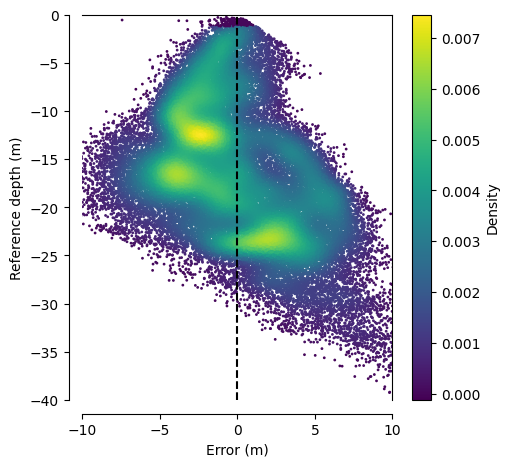

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('1_stumpf_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

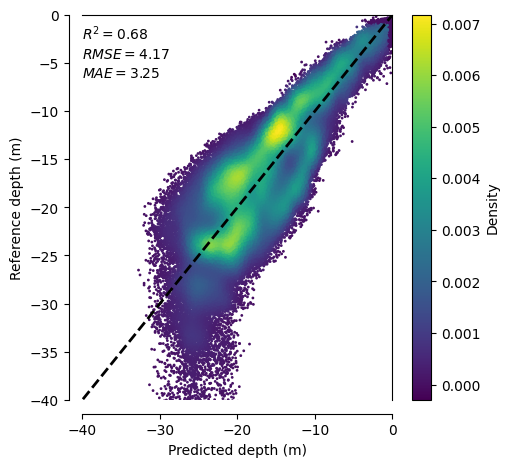

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('1_stumpf_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-11-be8f495d35ba>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-11-be8f495d35ba>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

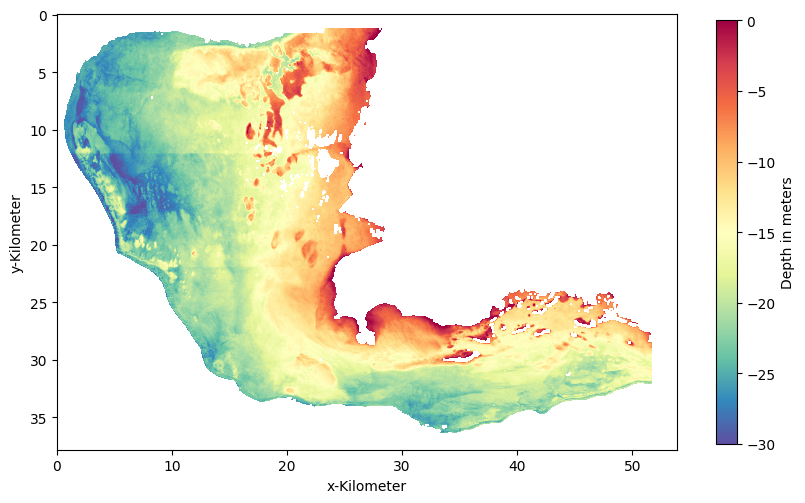

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
# Create a mask where True indicates not NaN
mask = np.isfinite(reference)

# Use the mask to filter the depth array
depth_masked = np.where(mask, depth, np.nan)

# Now 'depth_masked' only contains the pixels where 'reference' is not NaN.


norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth_masked, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('1_stumpf_depth_map.png', bbox_inches='tight', dpi=300)
files.download('1_stumpf_depth_map.png')



<ipython-input-12-0cc49de9c6ff>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-12-0cc49de9c6ff>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

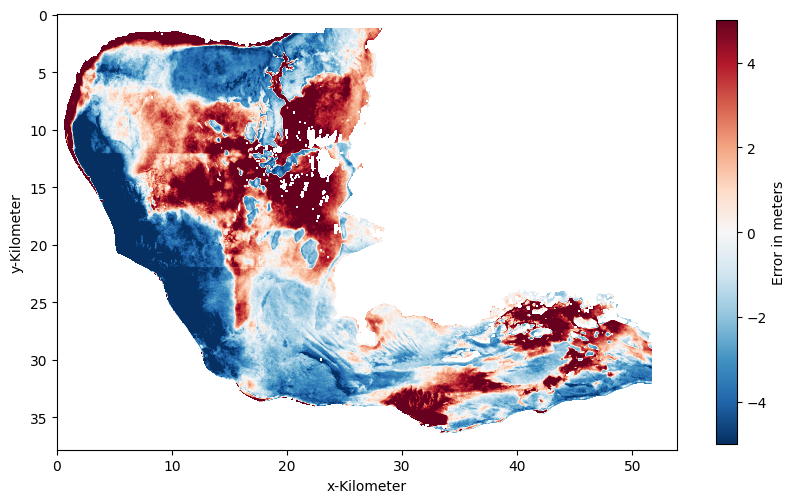

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('1_stumpf_error_map.png', bbox_inches='tight', dpi=300)
files.download('1_stumpf_error_map.png')



In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_stumpf_unl.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-13-55e66a342f07>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


<ipython-input-14-85a19872ec69>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-14-85a19872ec69>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

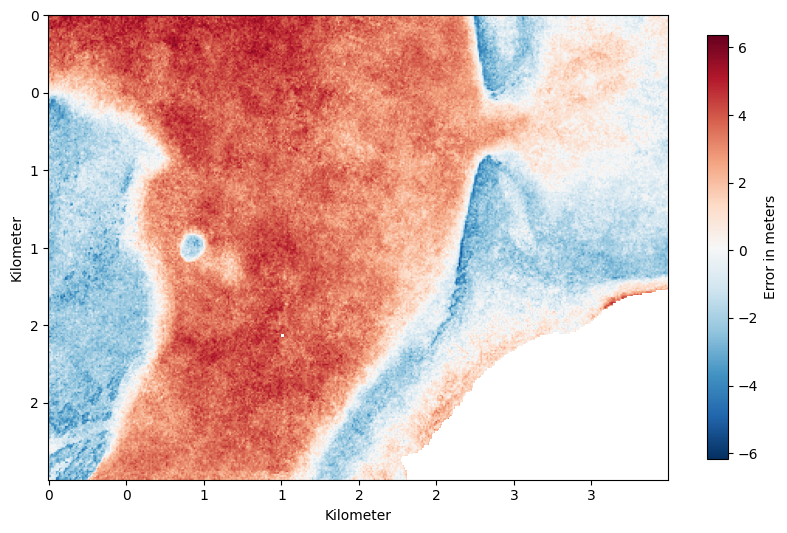

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error_small = error[1900:2200,2200:2600]
#norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error_small, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('Kilometer')
ax.set_ylabel('Kilometer')
#plt.show()
plt.savefig('1_stumpf_error_map_river.png', bbox_inches='tight', dpi=600)
files.download('1_stumpf_error_map_river.png')

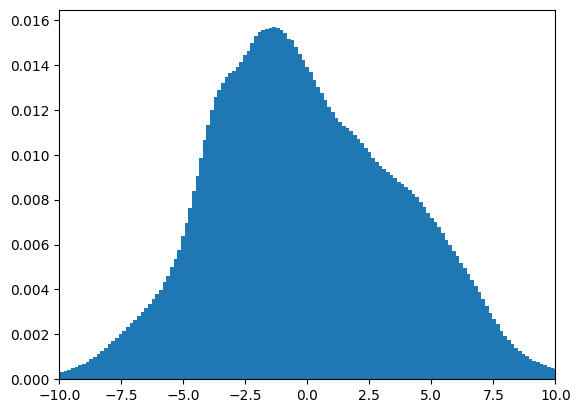

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
np.save('/content/drive/My Drive/Predictions_final/1_stumpf_error_histogram.npy', error)


In [ ]:
import numpy as np
import pandas as pd
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,3.249349,4.174273,8684009
1,"[-5, 0)",1.260234,1.562991,514199
2,"[-10, -5)",2.137187,2.536935,1096233
3,"[-15, -10)",2.861173,3.408792,1741271
4,"[-20, -15)",3.583119,4.233437,2353136
5,"[-25, -20)",3.167955,3.873490,2039787
6,"[-30, -25)",3.846007,4.502135,636137
7,"[-35, -30)",6.771911,7.284854,201332
8,"[-40, -35)",12.076640,12.357042,64390


In [ ]:
import numpy as np
import pandas as pd

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,3.249349,4.174273,8684009
1,"[-20.0, 0.0)",2.875543,3.520810,5704839
2,"[-30.0, -20.0)",3.329146,4.031826,2675924
3,"[-inf, -30.0)",9.577468,11.060636,303246


## Stumpf 20m

In [ ]:
# Stumpf max 20m
# Max 20m
## Regression
np.random.seed(42)

reference[reference > 0] = np.nan
reference[reference < - 20] = np.nan
#reference = reference[50:1450,100:1500]

# Until 30m
z_flatten = z.flatten() # Flatten Z values
df_z = pd.DataFrame(z_flatten) # Put Z values in dataframe
reference2 = reference.flatten() # Flatten reference lidar data
df_reference=pd.DataFrame(reference2) # Put reference data in dataframe
df = pd.concat([df_reference, df_z], axis=1) # Concatenate both dataframes
df2 = df.dropna() # Remove NaN values
df2.columns = ['Reference','Z']
df3 = df2.reset_index(drop=True)
df3

bin1 = df3.loc[(df3['Reference']< 0) & (df3['Reference']> -2)]
bin1s = bin1.sample(n = 5)
bin2 = df3.loc[(df3['Reference']< -2) & (df3['Reference']> -4)]
bin2s = bin2.sample(n = 5)
bin3 = df3.loc[(df3['Reference']< -4) & (df3['Reference']> -6)]
bin3s = bin3.sample(n = 5)
bin4 = df3.loc[(df3['Reference']< -6) & (df3['Reference']> -8)]
bin4s = bin4.sample(n = 5)
bin5 = df3.loc[(df3['Reference']< -8) & (df3['Reference']> -10)]
bin5s = bin5.sample(n = 5)
bin6 = df3.loc[(df3['Reference']< -10) & (df3['Reference']> -12)]
bin6s = bin6.sample(n = 5)
bin7 = df3.loc[(df3['Reference']< -12) & (df3['Reference']> -14)]
bin7s = bin7.sample(n = 5)
bin8 = df3.loc[(df3['Reference']< -14) & (df3['Reference']> -16)]
bin8s = bin8.sample(n = 5)
bin9 = df3.loc[(df3['Reference']< -16) & (df3['Reference']> -18)]
bin9s = bin9.sample(n = 5)
bin10 = df3.loc[(df3['Reference']< -18) & (df3['Reference']> -20)]
bin10s = bin10.sample(n = 5)


df_sample = pd.concat([bin1s,bin2s,bin3s,bin4s,bin5s,bin6s,bin7s,bin8s,bin9s,bin10s])

# Linear regression to calculate k0 and k1:
model = sm.OLS(df_sample.Reference, sm.add_constant(df_sample.Z)).fit()
print_model = model.summary()
print(print_model)

# Scoring metrics
df3['Depth'] = df3['Z'] * model.params[1] + model.params[0]
depth = z*model.params[1] + model.params[0]
df3['Depth'] = df3['Depth'][df3['Depth'] < 0]
df3['Depth'] = df3['Depth'][df3['Depth'] > -50]

#df3['Reference'] = df3['Depth'][df3['Depth'] > -30] # max depth

df3 = df3.dropna()
df3['Error'] = df3['Depth'] - df3['Reference']
df3['Error_abs'] = np.abs(df3['Error'])
df3['Error_abs'].mean()

# Metrics
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

                            OLS Regression Results                            
Dep. Variable:              Reference   R-squared:                       0.828
Model:                            OLS   Adj. R-squared:                  0.824
Method:                 Least Squares   F-statistic:                     230.8
Date:                Wed, 28 Jun 2023   Prob (F-statistic):           5.76e-20
Time:                        12:51:25   Log-Likelihood:                -114.86
No. Observations:                  50   AIC:                             233.7
Df Residuals:                      48   BIC:                             237.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -268.4331     17.014    -15.777      0.0

<ipython-input-19-49785427aaba>:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Error'] = df3['Depth'] - df3['Reference']
<ipython-input-19-49785427aaba>:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['Error_abs'] = np.abs(df3['Error'])


RMSE: 2.8419377783537016
MAE: 2.1795251615374847
R2: 0.6829715274148394


<ipython-input-20-fac2f6a42d4f>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-20-fac2f6a42d4f>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

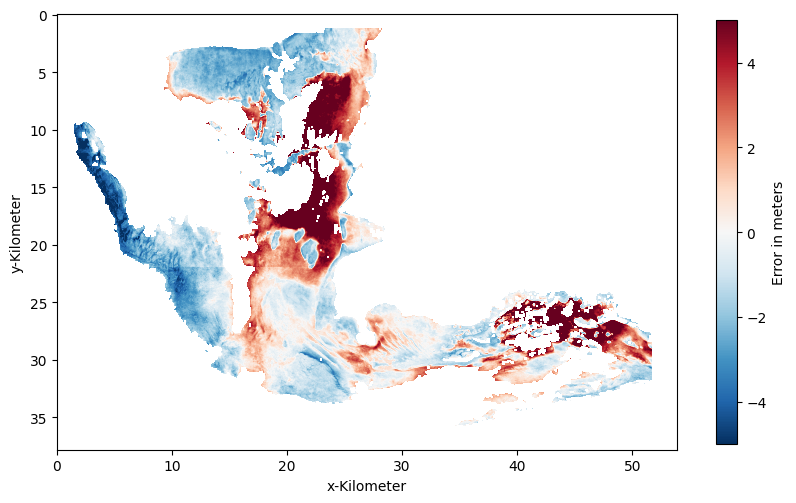

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('1_stumpf_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('1_stumpf_error_map_20m.png')


<ipython-input-21-109c1366d2e9>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-21-109c1366d2e9>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

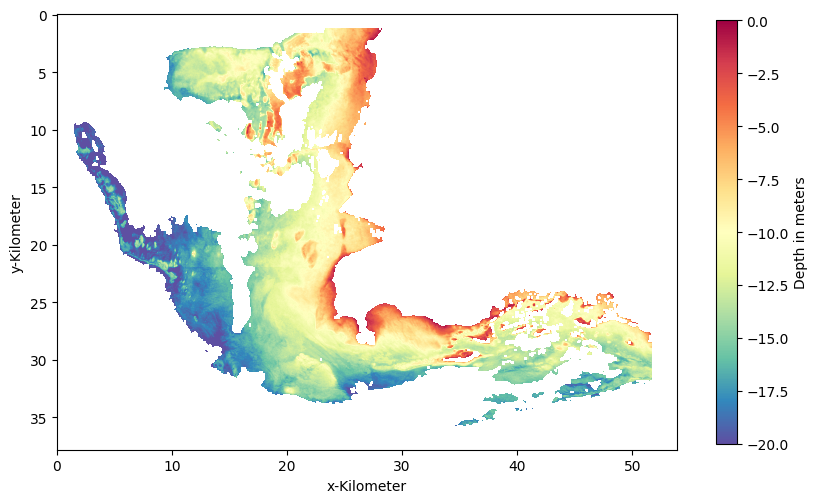

In [ ]:
mask = np.isfinite(reference)

# Use the mask to filter the depth array
depth_masked = np.where(mask, depth, np.nan)

norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth_masked, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('1_stumpf_depth_map_20m.png', bbox_inches='tight', dpi=300)
files.download('1_stumpf_depth_map_20m.png')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_stumpf_20m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-22-7fb36938e06a>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


<ipython-input-23-fa2a4712a00b>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-23-fa2a4712a00b>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

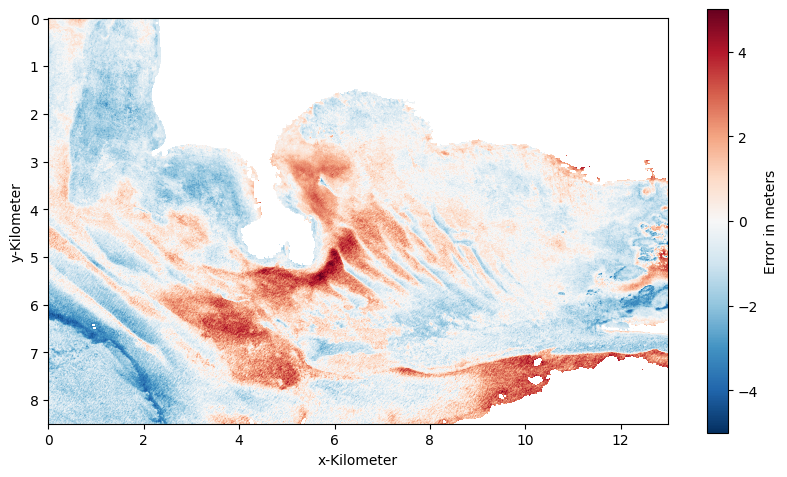

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error_small = error[2350:3200,2200:3500]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error_small, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('1_stumpf_error_map_small_20m.png', bbox_inches='tight', dpi=300)
files.download('1_stumpf_error_map_small_20m.png')


In [ ]:
# Flatten the error map
error_map_flat = error_small.flatten()

# Calculate the mean absolute error
mae = np.mean(np.abs(error_map_flat[np.isfinite(error_map_flat)]))

# Calculate the root mean squared error
rmse = np.sqrt(np.mean(error_map_flat[np.isfinite(error_map_flat)]**2))

print('MAE:', mae)
print('RMSE:', rmse)

MAE: 1.0831668660585592
RMSE: 1.388718994577787


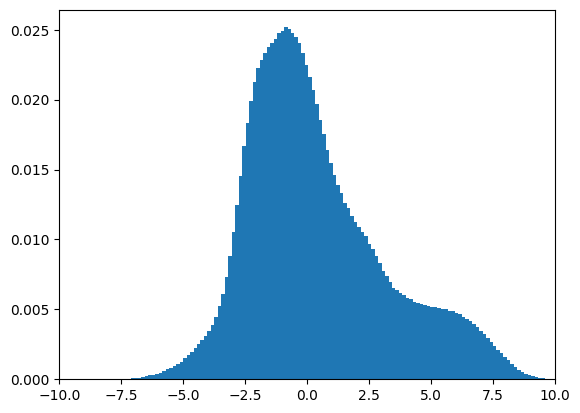

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

In [ ]:
np.save('/content/drive/My Drive/Predictions_final/1_stumpf_error_histogram_20m.npy', error)

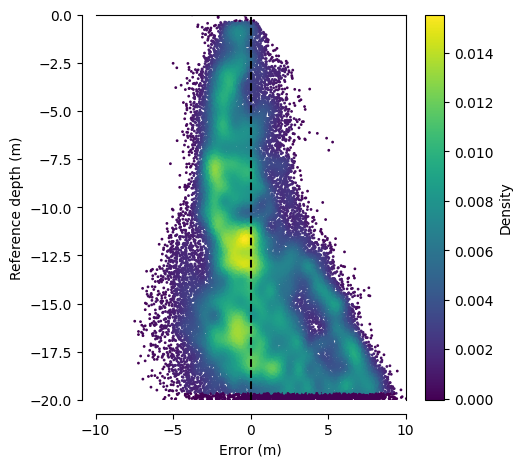

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
 #   plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('1_stumpf_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

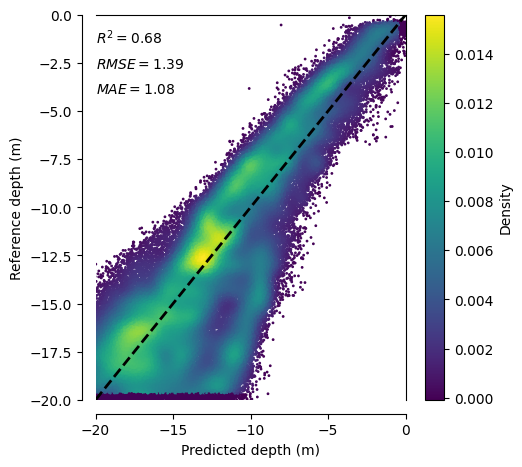

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('1_stumpf_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,2.179525,2.841938,5760097
1,"[-5, 0)",1.268468,1.513836,569275
2,"[-10, -5)",1.523820,1.807594,1096415
3,"[-15, -10)",1.902150,2.399296,1741271
4,"[-20, -15)",2.910700,3.665194,2353136


#2: Ma et al. (2013)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/2_Ma_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/2_Ma_predictions.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/2_Ma_error.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/2_Ma_dataframe.csv')

NameError: ignored

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_Ma_unl.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-31-4f7863db6338>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


In [ ]:
rmse, mae, r2,df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 3.675972595229228
MAE: 2.6512125989792694
R2: 0.7374455525221213


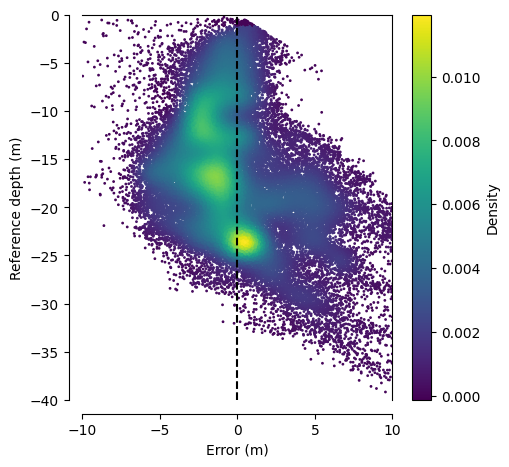

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('2_Ma_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

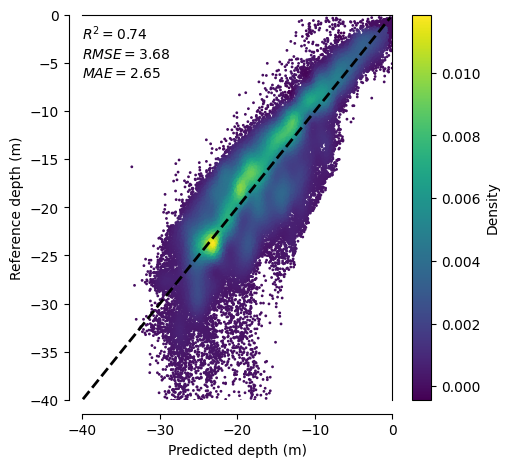

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
 #   plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('2_Ma_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-35-b5315f28c8da>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-35-b5315f28c8da>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

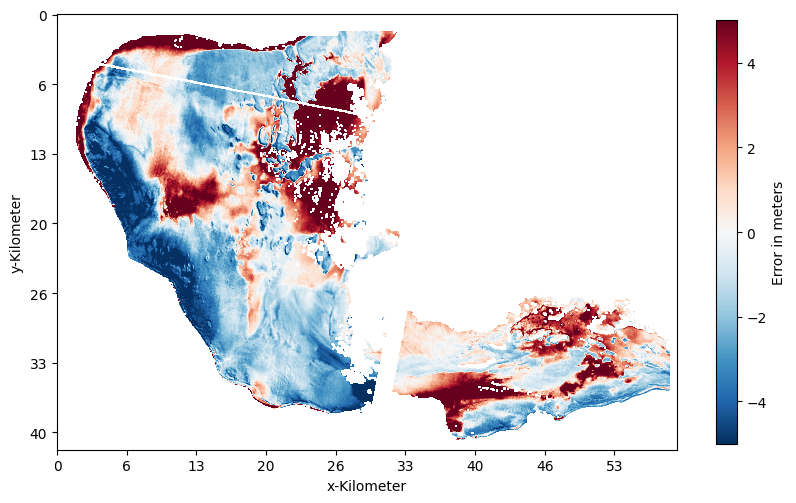

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error = error[850:2100,120:1900]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('2_Ma_error_map.png', bbox_inches='tight', dpi=300)
files.download('2_Ma_error_map.png')



<ipython-input-36-b6649524ba50>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-36-b6649524ba50>:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

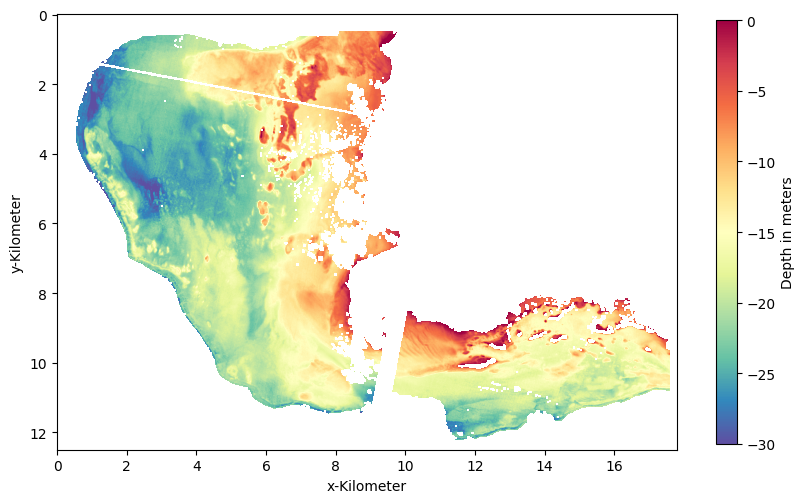

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
mask = np.isfinite(reference)

# Use the mask to filter the depth array
depth_masked = np.where(mask, depth, np.nan)
depth_masked = depth_masked[850:2100,120:1900]

norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth_masked, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('2_Ma_depth_map.png', bbox_inches='tight', dpi=300)
files.download('2_Ma_depth_map.png')


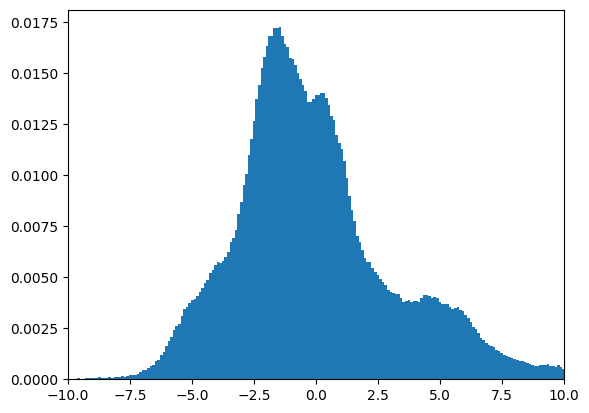

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]

np.save('/content/drive/My Drive/Predictions_final/2_Ma_error_histogram.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,2.651213,3.675973,902818
1,"[-5, 0)",1.394151,1.954730,47471
2,"[-10, -5)",1.581960,1.993817,113269
3,"[-15, -10)",2.275224,2.741518,175637
4,"[-20, -15)",2.817795,3.419660,251327
5,"[-25, -20)",2.473177,3.365424,220650
6,"[-30, -25)",3.331092,4.233825,65792
7,"[-35, -30)",6.771298,7.573189,19139
8,"[-40, -35)",12.854760,13.496682,6191


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,2.651213,3.675973,902818
1,"[-20.0, 0.0)",2.302469,2.884759,587704
2,"[-30.0, -20.0)",2.670229,3.583550,286442
3,"[-inf, -30.0)",9.609597,11.252421,28672


## Ma et al. (2013) max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/2_Ma_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/2_Ma_predictions_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/2_Ma_error_20m.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/2_Ma_dataframe_20m.csv')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_Ma_20m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-41-27bd310b0cf3>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


In [ ]:
rmse, mae, r2,df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.4998709227599405
MAE: 1.8231511842421801
R2: 0.745915463632161


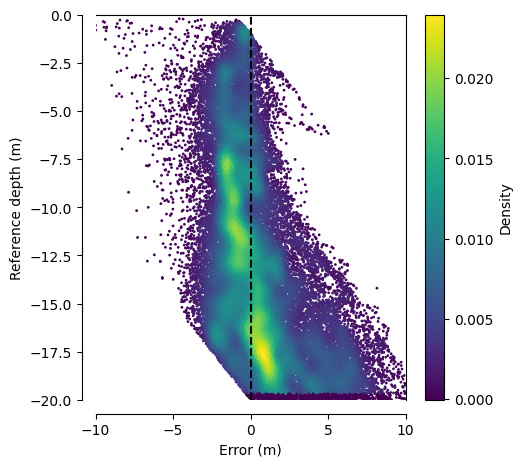

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('2_Ma_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

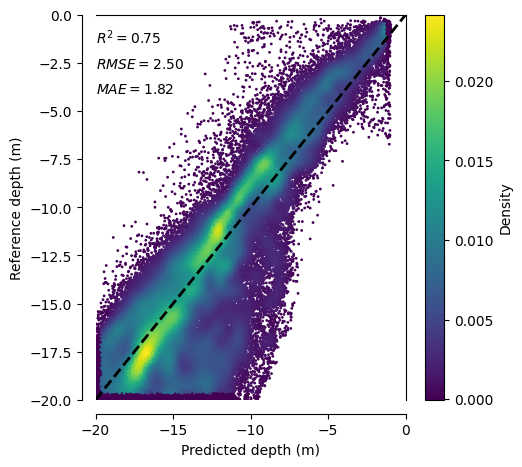

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('2_Ma_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-45-b731acb964bc>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-45-b731acb964bc>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

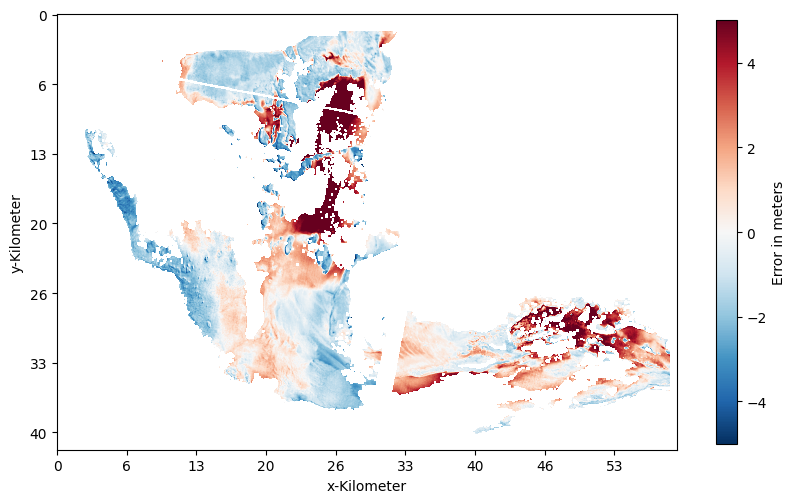

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error = error[850:2100,120:1900]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('2_Ma_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('2_Ma_error_map_20m.png')



<ipython-input-46-9394a9967bd3>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-46-9394a9967bd3>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

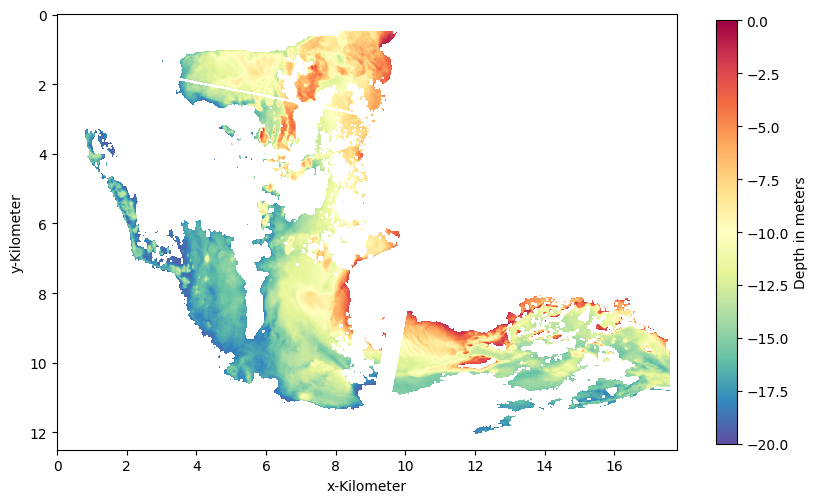

In [ ]:
mask = np.isfinite(reference)

# Use the mask to filter the depth array
depth_masked = np.where(mask, depth, np.nan)
depth_masked = depth_masked[850:2100,120:1900]

norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth_masked, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('2_Ma_depth_map_20m.png', bbox_inches='tight', dpi=300)
files.download('2_Ma_depth_map_20m.png')

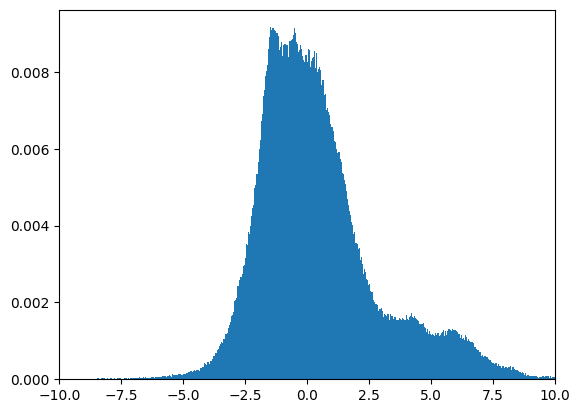

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/2_Ma_error_histogram_20m.npy', error)

plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.823151,2.499871,581467
1,"[-5, 0)",1.445820,1.942162,53243
2,"[-10, -5)",1.258619,1.593524,113393
3,"[-15, -10)",1.475469,1.906080,175613
4,"[-20, -15)",2.429969,3.237276,239218


#3: Sentinel-2 XGBoost

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_predictions.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_error.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_dataframe.csv')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_XGBoost_unl.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-50-052e7fd401df>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


Number of predictions greater than 0: 1329


In [ ]:
reference.shape

(3783, 5389)

In [ ]:
depth.shape

(3860, 5389)

In [ ]:
# Filter rows where Predicted is less than or equal to 0
df3 = df3[df3['Predicted'] < 0]
df3

,Reference,Predicted,Error
0,-8.986667,-9.529885,-0.543219
1,-8.793333,-11.640145,-2.846812
2,-8.912500,-10.313888,-1.401387
3,-8.889999,-13.152531,-4.262531
4,-8.772499,-13.963599,-5.191100
...,...,...,...
8760010,-33.148125,-29.224205,3.923920
8760011,-33.300003,-28.524506,4.775497
8760012,-33.347500,-28.843266,4.504234
8760013,-34.260000,-28.931520,5.328478


In [ ]:
# Metrics
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))

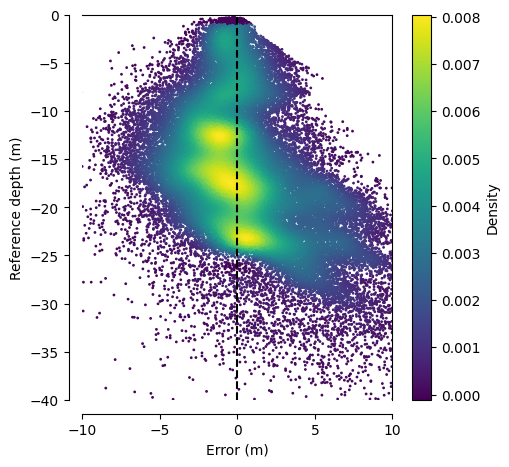

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('3_XGBoost_S2_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

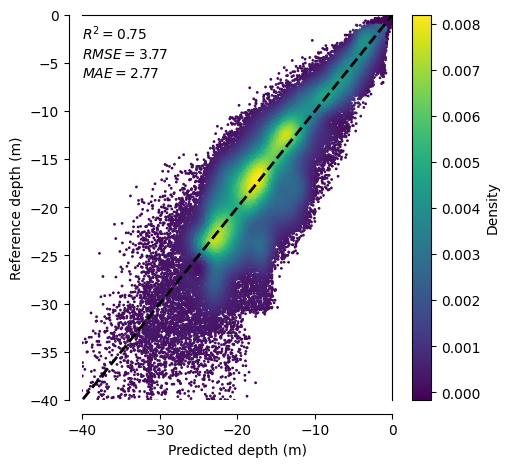

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
 #   plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('3_XGBoost_S2_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-58-ddb0282540f6>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-58-ddb0282540f6>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

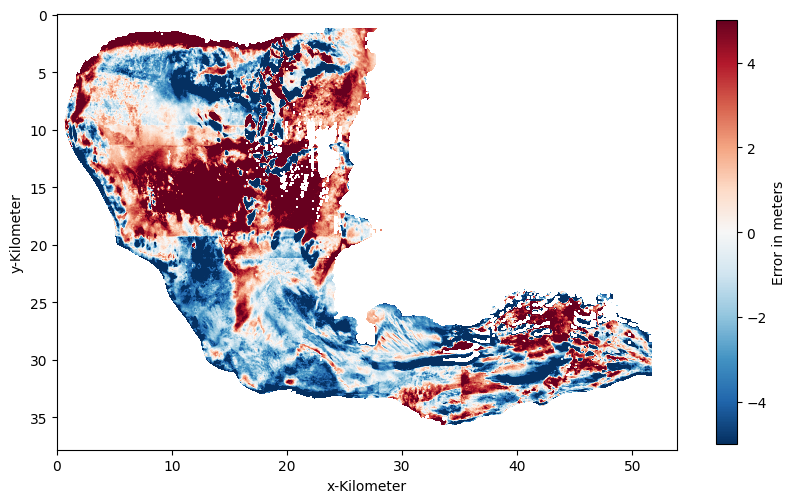

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('3_XGBoost_S2_error_map.png', bbox_inches='tight', dpi=300)
files.download('3_XGBoost_S2_error_map.png')



<ipython-input-59-9b527481a535>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-59-9b527481a535>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

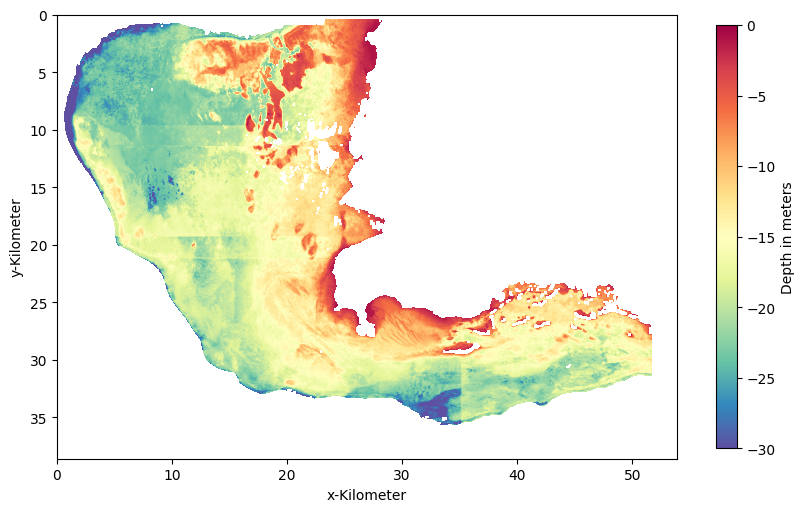

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('3_XGBoost_S2_depth_map.png', bbox_inches='tight', dpi=300)
files.download('3_XGBoost_S2_depth_map.png')



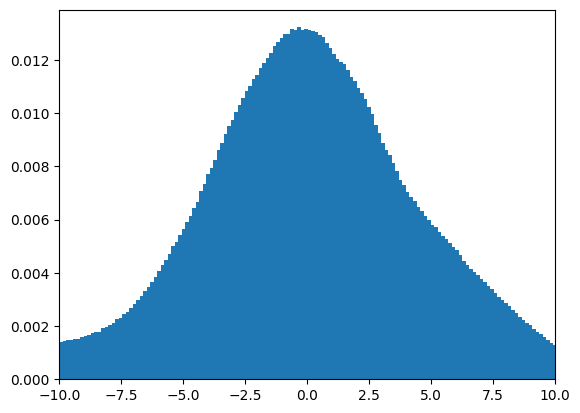

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/3_S2_XGBoost_error_histogram.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,2.772417,3.769212,8758686
1,"[-5, 0)",1.030611,1.388704,586536
2,"[-10, -5)",1.842146,2.362925,1096410
3,"[-15, -10)",2.367162,2.995752,1741271
4,"[-20, -15)",2.566618,3.247667,2353136
5,"[-25, -20)",2.911642,3.805613,2039787
6,"[-30, -25)",5.100106,5.853355,636137
7,"[-35, -30)",6.292200,7.358179,201332
8,"[-40, -35)",8.222980,9.507615,64390


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,2.772417,3.769212,8758686
1,"[-20.0, 0.0)",2.213074,2.873369,5777353
2,"[-30.0, -20.0)",3.431897,4.380033,2675924
3,"[-inf, -30.0)",7.623309,9.150904,303246


## Sentinel-2 XGBoost max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_reference_20m_avg.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_predictions_20m_avg.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_dataframe_20m_avg.csv')

In [ ]:
depth.shape

(3762, 5389)

In [ ]:
rmse, mae, r2,df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.3345907
MAE: 1.7590889
R2: 0.784842029448386


In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

MAE: 1.7590889
RMSE 2.3345907
R2: 0.784842029448386


<ipython-input-67-1278bf09a612>:11: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-67-1278bf09a612>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-67-1278bf09a612>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

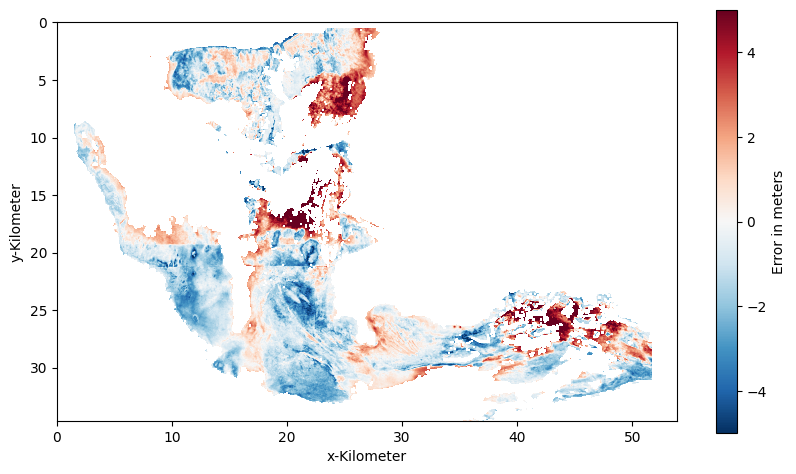

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_XGBoost_20m.tif'
# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('3_XGBoost_S2_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('3_XGBoost_S2_error_map_20m.png')


<ipython-input-68-71672fdd1903>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-68-71672fdd1903>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

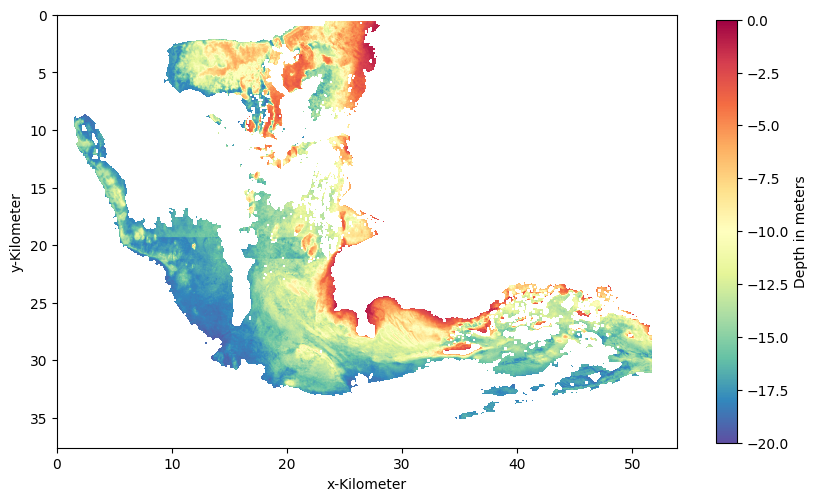

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('3_XGBoost_S2_depth_map_20m.png', bbox_inches='tight', dpi=300)
files.download('3_XGBoost_S2_depth_map_20m.png')

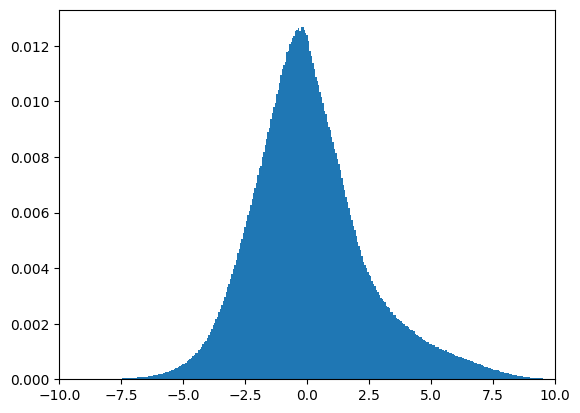

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/3_S2_XGBoost_error_histogram_20m.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

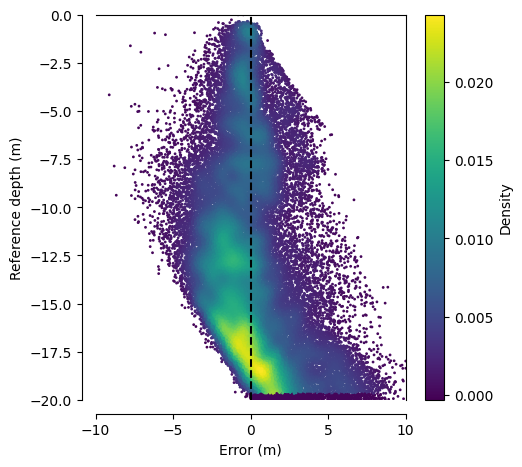

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
 #   plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('3_XGBoost_S2_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

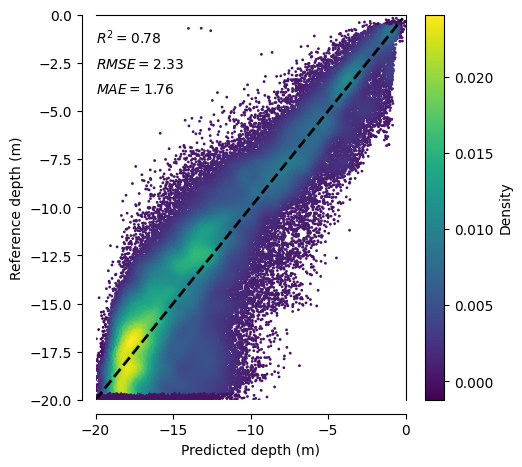

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('3_XGBoost_S2_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.759089,2.334591,5688829
1,"[-5, 0)",0.991529,1.343234,555951
2,"[-10, -5)",1.673306,2.161876,1083814
3,"[-15, -10)",1.837108,2.275620,1723711
4,"[-20, -15)",1.924748,2.624025,2325353


## Sentinel-2 XGBoost 30m resolution

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_reference_30_10.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_predictions_30_10.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/3_XGBoost_S2_dataframe_30m_QGIS.csv')

In [ ]:
depth.shape

(3762, 5389)

In [ ]:
rmse, mae, r2,df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.3228652
MAE: 1.743647
R2: 0.7876730704137253


In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

MAE: 1.743647
RMSE 2.3228652
R2: 0.7876730704137253


<ipython-input-77-bdde3406dccb>:12: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-77-bdde3406dccb>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-77-bdde3406dccb>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

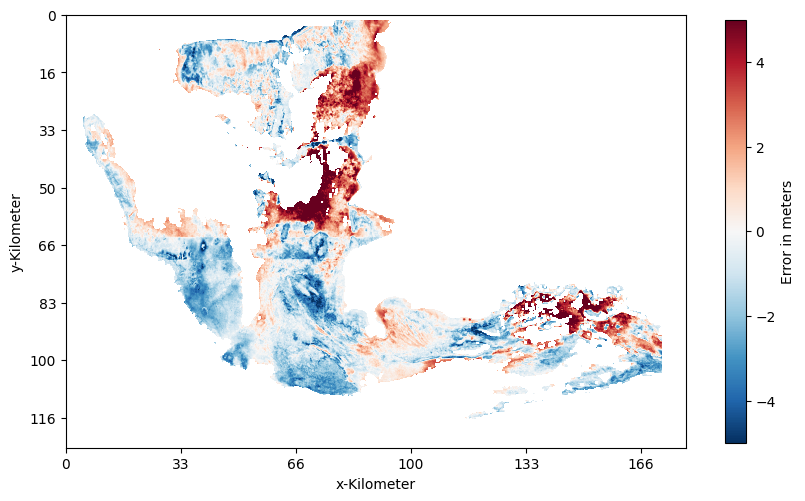

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_XGBoost_30m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 30
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('3_XGBoost_S2_error_map_20m_30m.png', bbox_inches='tight', dpi=300)
files.download('3_XGBoost_S2_error_map_20m_30m.png')


<ipython-input-78-a766c662c7fd>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-78-a766c662c7fd>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

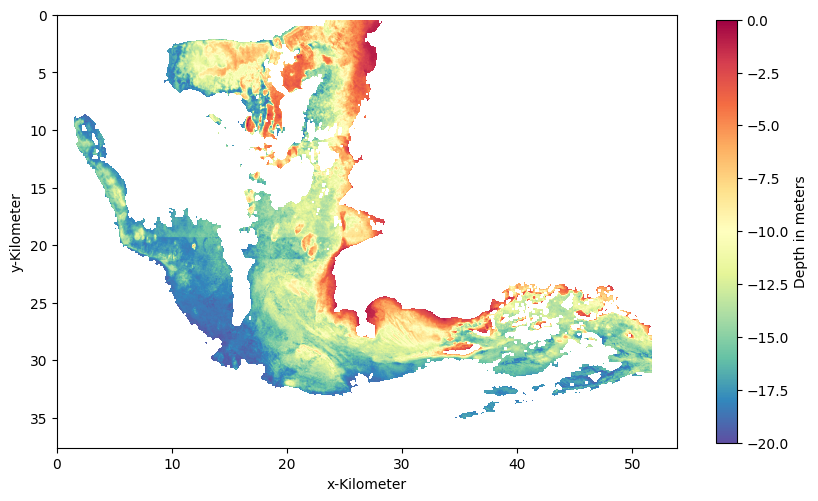

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('3_XGBoost_S2_depth_map_20m_30m.png', bbox_inches='tight', dpi=300)
files.download('3_XGBoost_S2_depth_map_20m_30m.png')

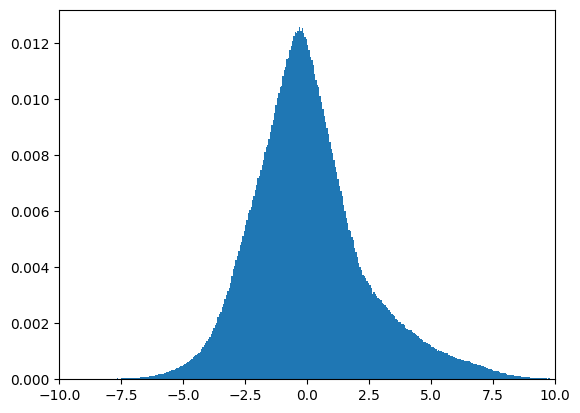

In [ ]:
# create histogram of errors
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.3228652
MAE: 1.743647
R2: 0.7876730704137253


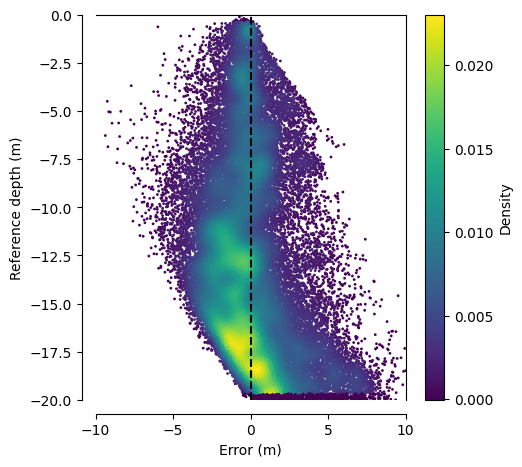

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('3_XGBoost_S2_depth_vs_error_20m_30m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

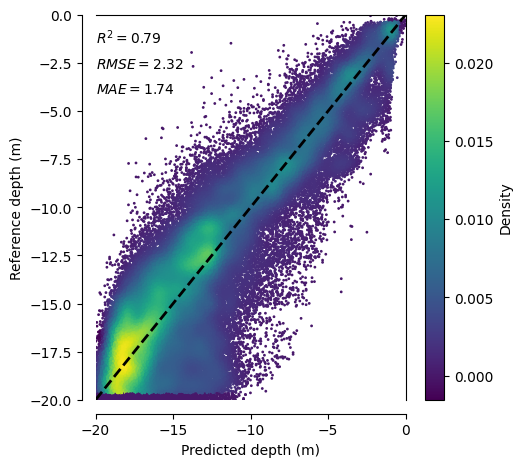

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('3_XGBoost_S2_depth_vs_predicted_20m_30m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.743647,2.322865,5755459
1,"[-5, 0)",1.036111,1.422845,564755
2,"[-10, -5)",1.639321,2.141315,1096307
3,"[-15, -10)",1.789018,2.236621,1741275
4,"[-20, -15)",1.928488,2.621710,2353122


# 4: PRISMA XGBoost

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_predictions.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_error.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_dataframe.csv')

In [ ]:
reference.shape

(1300, 1800)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 3.0426033
MAE: 2.0012298
R2: 0.8244116663044243


<ipython-input-87-8a5fcb8543f7>:13: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-87-8a5fcb8543f7>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-87-8a5fcb8543f7>:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

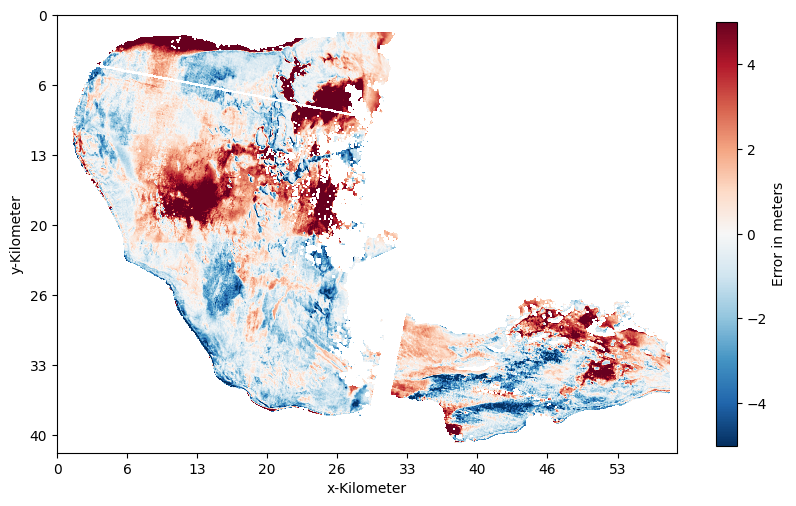

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error = error[50:, 30:]

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_PRISMA_XGBoost_unl.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('4_XGBoost_PRISMA_error_map.png', bbox_inches='tight', dpi=300)
files.download('4_XGBoost_PRISMA_error_map.png')


<ipython-input-88-d66da7888c2a>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-88-d66da7888c2a>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

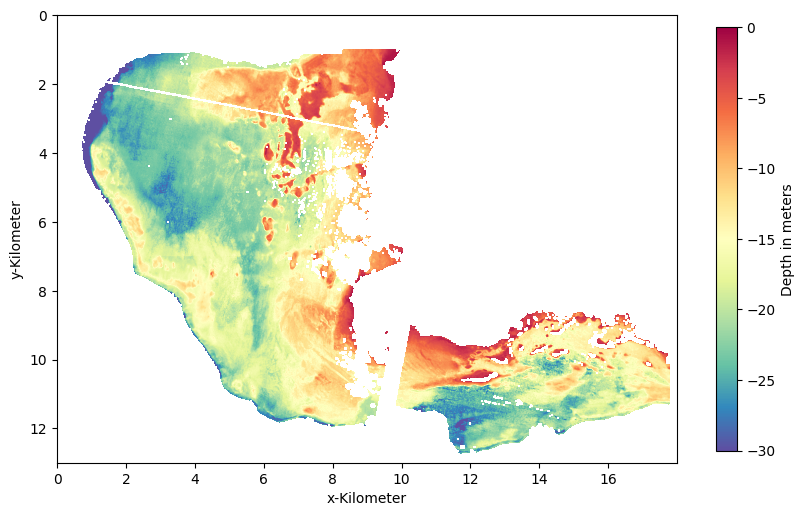

In [ ]:

norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('4_XGBoost_PRISMA_depth_map.png', bbox_inches='tight', dpi=300)
files.download('4_XGBoost_PRISMA_depth_map.png')


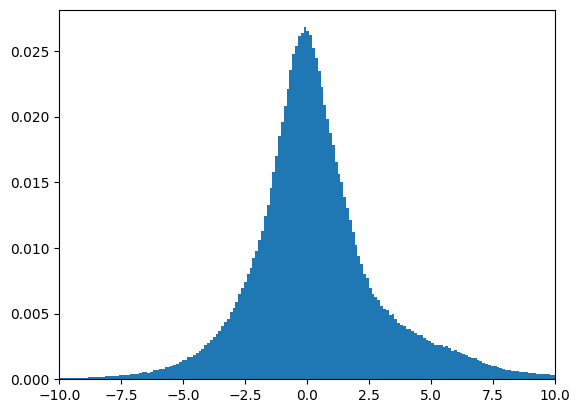

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/4_PRISMA_XGBoost_error_histogram.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

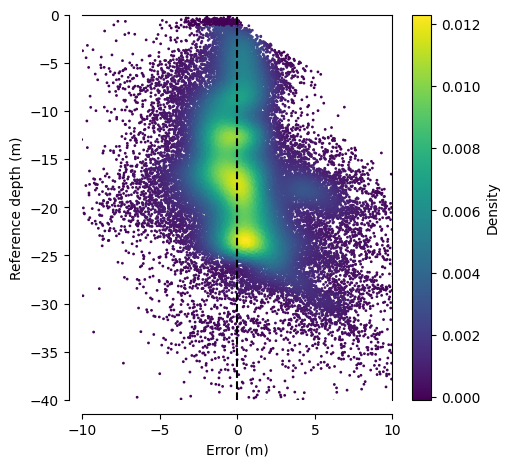

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('4_XGBoost_PRISMA_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

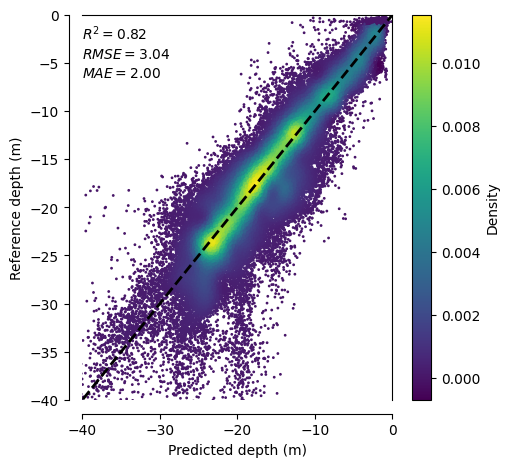

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('4_XGBoost_PRISMA_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,2.000992,3.041953,908689
1,"[-5, 0)",0.983450,1.517460,53240
2,"[-10, -5)",1.382950,1.956877,113393
3,"[-15, -10)",1.452027,1.948359,175637
4,"[-20, -15)",2.026163,2.812008,251327
5,"[-25, -20)",1.875226,2.673111,220650
6,"[-30, -25)",3.311788,4.107927,65792
7,"[-35, -30)",5.807254,6.978477,19133
8,"[-40, -35)",9.595292,11.526778,6187


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,2.000992,3.041953,908689
1,"[-20.0, 0.0)",1.639892,2.325772,593597
2,"[-30.0, -20.0)",2.205185,3.062723,286442
3,"[-inf, -30.0)",7.441055,9.361338,28650


## 4: PRISMA XGBoost max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_predictions_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_error_20m.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/4_XGBoost_PRISMA_dataframe_20m.csv')

In [ ]:
rmse, mae, r2,d3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.0051591
MAE: 1.3846052
R2: 0.8381043022284715


<ipython-input-96-3377575d731a>:12: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-96-3377575d731a>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-96-3377575d731a>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

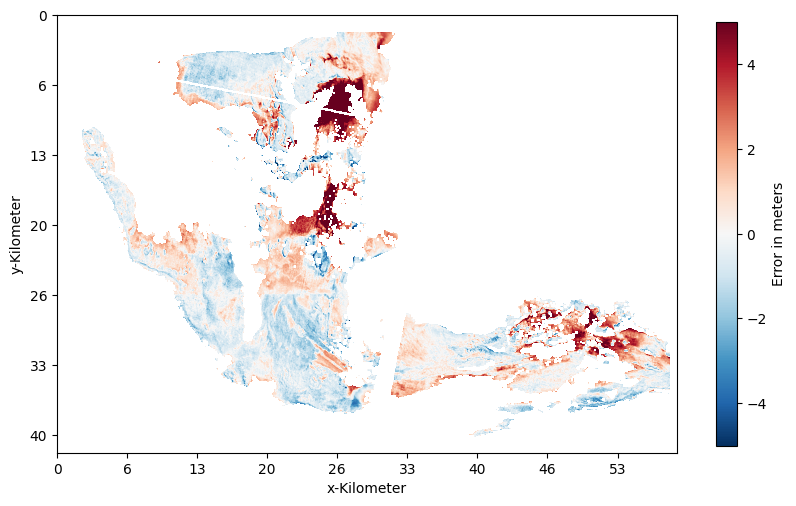

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error = error[50:, 30:]

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_PRISMA_XGBoost_20m.tif'
# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('4_XGBoost_PRISMA_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('4_XGBoost_PRISMA_error_map_20m.png')


<ipython-input-97-5974d6d13b3b>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-97-5974d6d13b3b>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

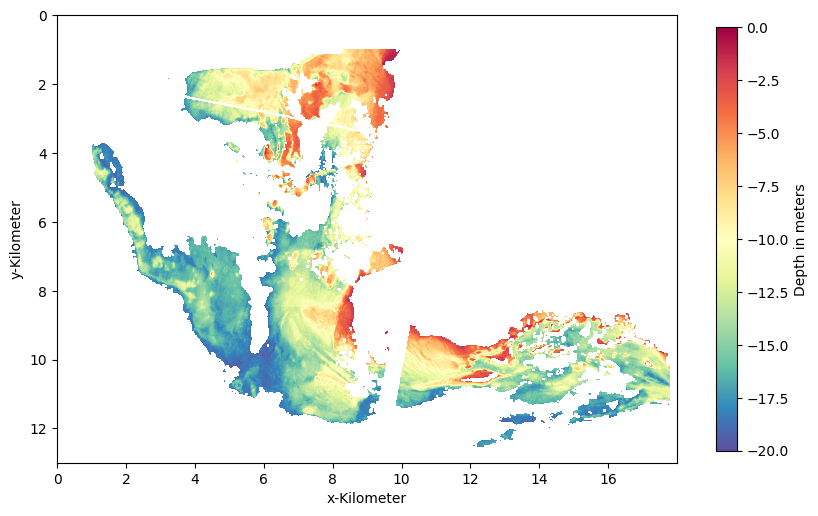

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('4_XGBoost_PRISMA_depth_map_20m.png', bbox_inches='tight', dpi=300)
files.download('4_XGBoost_PRISMA_depth_map_20m.png')

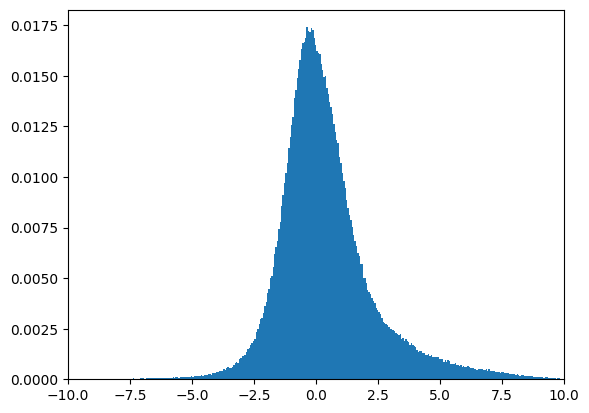

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/4_PRISMA_XGBoost_error_histogram_20m.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

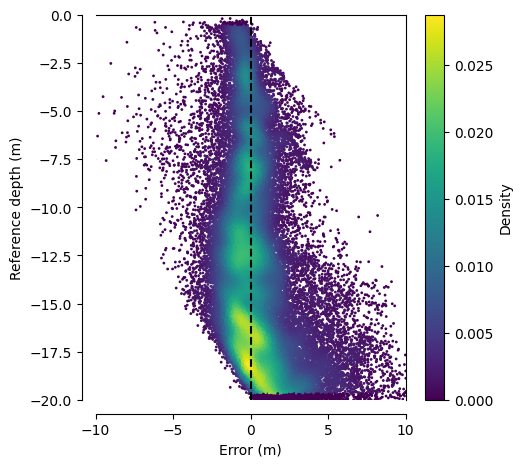

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
 #   plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('4_XGBoost_PRISMA_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

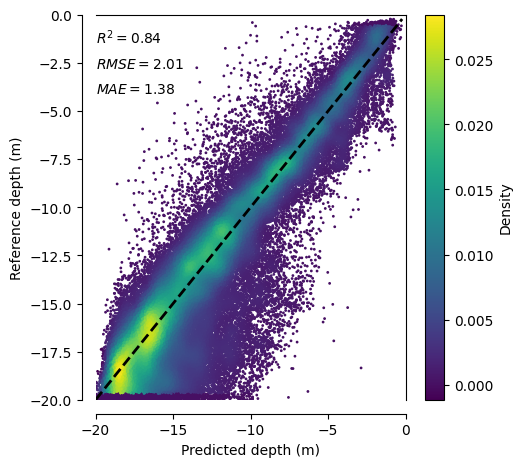

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
#    plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('4_XGBoost_PRISMA_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.384605,2.005159,593600
1,"[-5, 0)",0.895582,1.330111,53243
2,"[-10, -5)",1.060616,1.533848,113393
3,"[-15, -10)",1.267858,1.702742,175637
4,"[-20, -15)",1.715967,2.456382,251327


# 5: Sentinel-2 CNN on median image

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/5_S2_simple_CNN_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/5_S2_simple_CNN_median.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/5_S2_simple_CNN_error.npy')

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 3.1494594101006195
MAE: 2.2796177135301874
R2: 0.8199896370632408


In [ ]:
mask = ~np.isnan(depth.flatten())
non_nan_predictions = depth.flatten()[mask]
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)
(num_predictions_gt_0/len(non_nan_predictions))*100
# 0.68% of the pixels predicted larger than 0

Number of predictions greater than 0: 11041


0.126697785904266

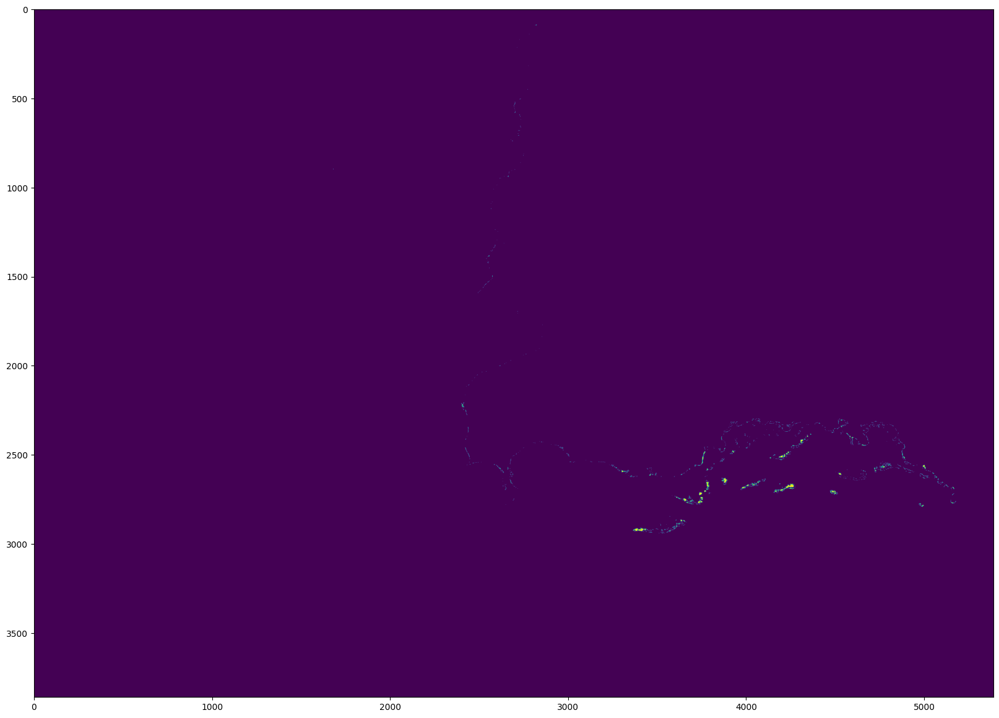

In [ ]:
mask = depth > 0
fig, ax = plt.subplots(figsize=(20, 20))
plt.imshow(mask)
plt.show()

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 3.1494594101006195
MAE: 2.2796177135301874
R2: 0.8199896370632408


<ipython-input-107-c6e73116704d>:11: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-107-c6e73116704d>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-107-c6e73116704d>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

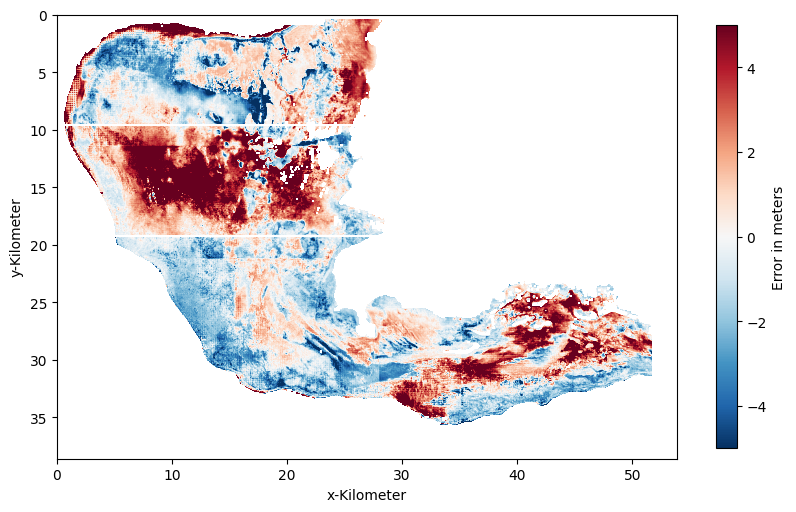

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_simple_CNN_unl.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('5_S2_simple_CNN_error_map.png', bbox_inches='tight', dpi=300)
files.download('5_S2_simple_CNN_error_map.png')


<ipython-input-108-8a1076cf0c77>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-108-8a1076cf0c77>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

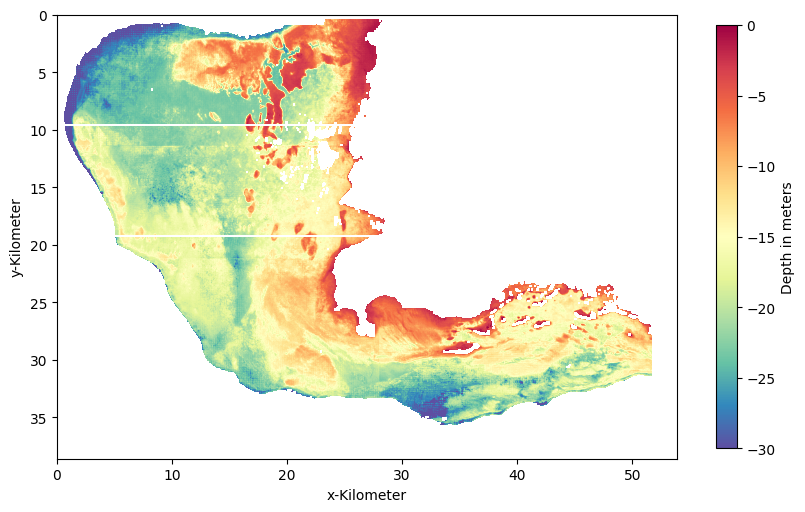

In [ ]:

norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('5_S2_Simple_CNN_depth_map.png', bbox_inches='tight', dpi=300)
files.download('5_S2_Simple_CNN_depth_map.png')


In [ ]:
# import matplotlib.colors as mcolors
# import matplotlib.pyplot as plt
# from google.colab import files

# error = depth-reference
# #error = error[2200:2400, ]
# norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
# fig, ax = plt.subplots(figsize=(10, 10))
# pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
# cbar = plt.colorbar(pc, shrink=0.55)
# cbar.ax.set_ylabel('Error in meters')
# # # Divide the tick values by 100
# xticks = [str(int(x // 100)) for x in ax.get_xticks()]
# yticks = [str(int(y // 100)) for y in ax.get_yticks()]
# ax.set_xticklabels(xticks)
# ax.set_yticklabels(yticks)
# ax.set_xlabel('Kilometer')
# ax.set_ylabel('Kilometer')
# #plt.show()
# plt.savefig('5_S2_simple_CNN_error_map.png', bbox_inches='tight', dpi=600)
# files.download('5_S2_simple_CNN_error_map.png')


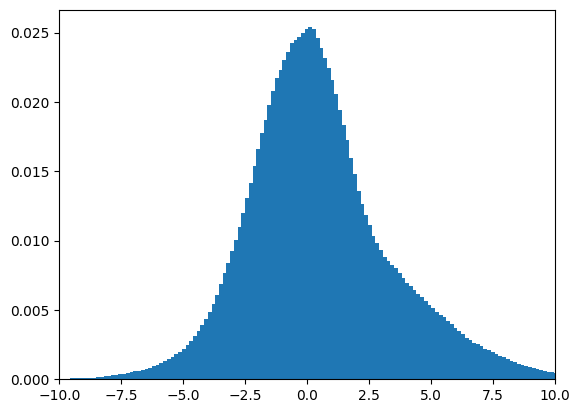

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/5_S2_simple_CNN_error_histogram.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

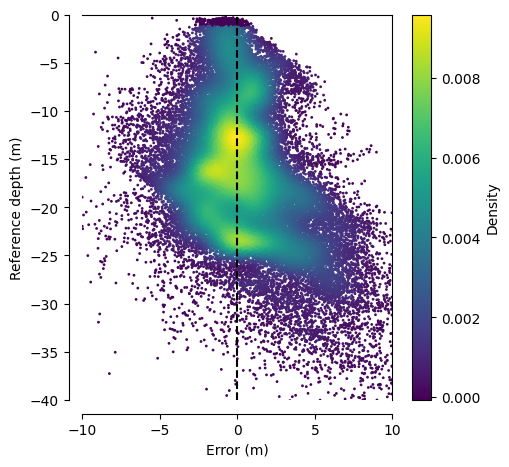

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('5_S2_simple_CNN_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

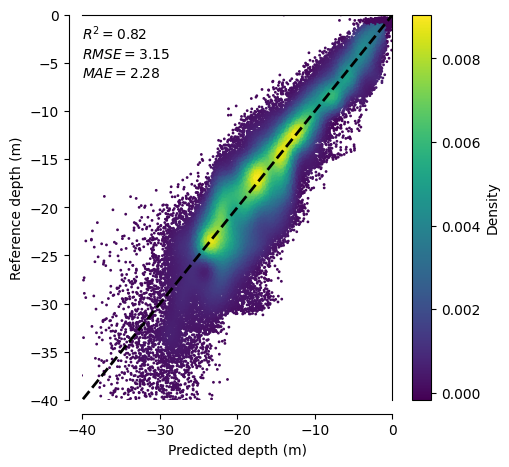

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
 #   plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('5_S2_simple_CNN_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,2.279377,3.143151,8703297
1,"[-5, 0)",1.117126,1.443533,565894
2,"[-10, -5)",1.526663,1.971467,1093126
3,"[-15, -10)",1.633672,2.211287,1735614
4,"[-20, -15)",2.123846,2.633696,2345510
5,"[-25, -20)",2.442297,3.176256,2029731
6,"[-30, -25)",4.293328,5.046712,634402
7,"[-35, -30)",5.547873,6.342516,200306
8,"[-40, -35)",7.429072,8.106941,63483


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,2.279377,3.143151,8703297
1,"[-20.0, 0.0)",1.762662,2.293118,5740144
2,"[-30.0, -20.0)",2.883078,3.708256,2664133
3,"[-inf, -30.0)",6.819801,8.005684,299020


## 5: Sentinel-2 CNN on median image max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/5_S2_simple_CNN_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/5_S2_simple_CNN_median_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/5_S2_simple_CNN_error_20m.npy')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_simple_CNN_20m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-116-72e9423f1592>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 1.816600120294796
MAE: 1.3860644112971428
R2: 0.8705854001390754


In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

MAE: 1.3860644112971428
RMSE 1.816600120294796
R2: 0.8705854001390754


In [ ]:
mask = ~np.isnan(depth.flatten())
non_nan_predictions = depth.flatten()[mask]
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)
(num_predictions_gt_0/len(non_nan_predictions))*100
# 0.68% of the pixels predicted larger than 0

Number of predictions greater than 0: 1980


0.03474760776759958

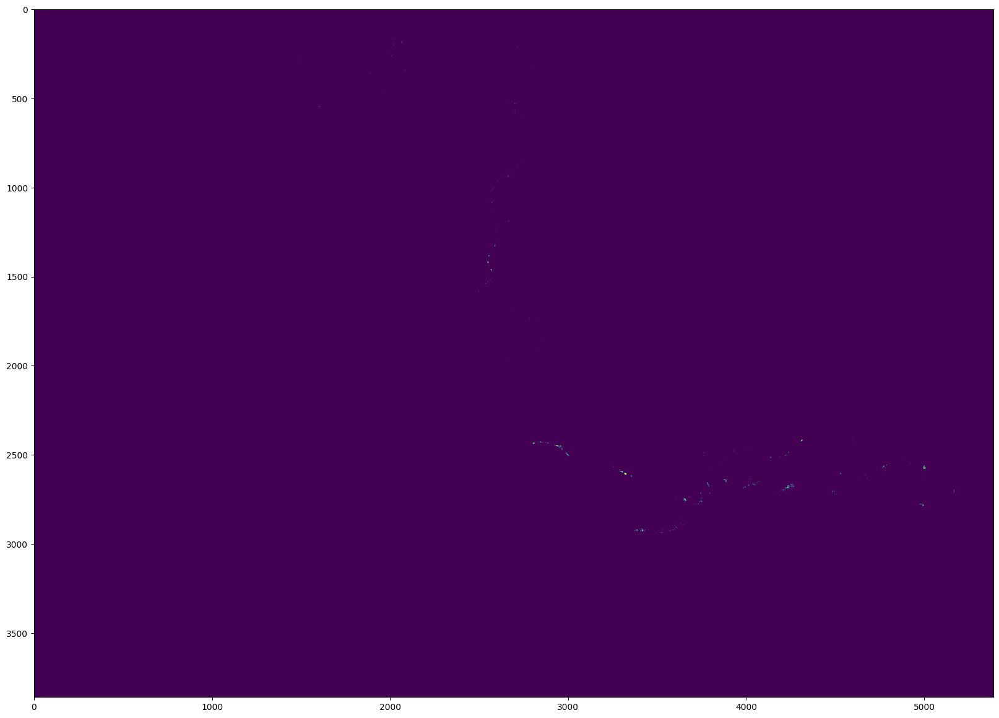

In [ ]:
mask = depth > 0
fig, ax = plt.subplots(figsize=(20, 20))
plt.imshow(mask)
plt.show()

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 1.816600120294796
MAE: 1.3860644112971428
R2: 0.8705854001390754


<ipython-input-122-ee67b23e288f>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-122-ee67b23e288f>:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

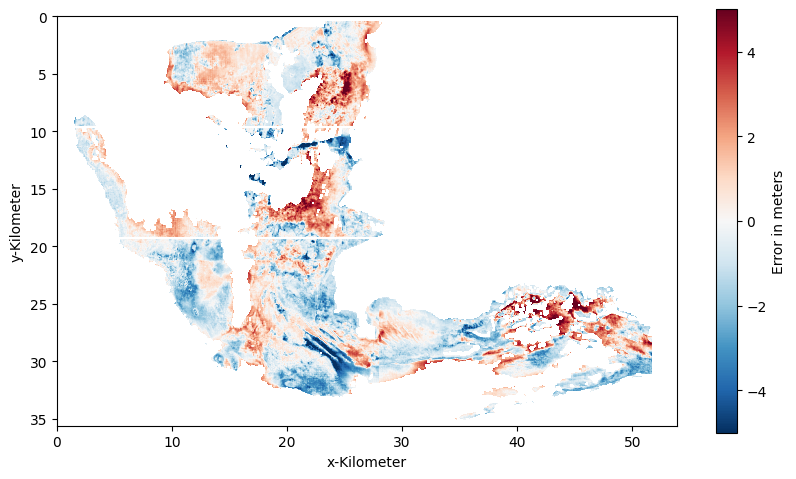

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('5_S2_simple_CNN_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('5_S2_simple_CNN_error_map_20m.png')


<ipython-input-123-18546b6f6fb1>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-123-18546b6f6fb1>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

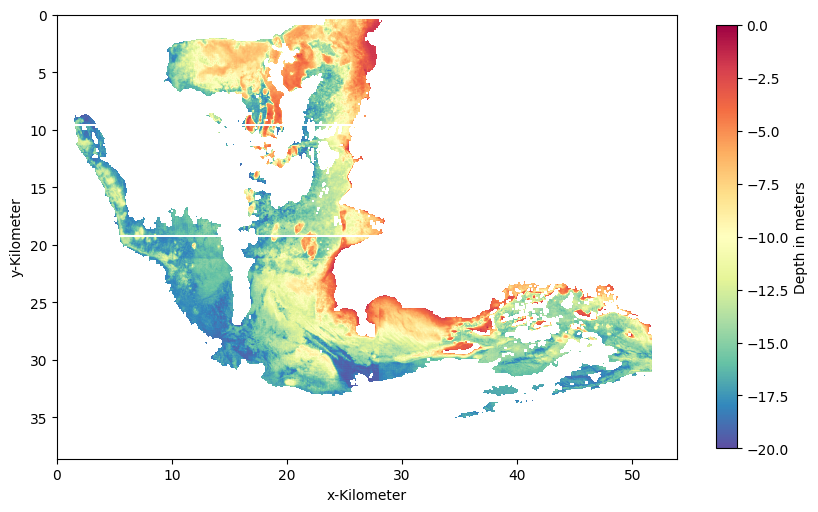

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('5_S2_simple_CNN_depth_map_20m.png', bbox_inches='tight', dpi=300)
files.download('5_S2_simple_CNN_depth_map_20m.png')

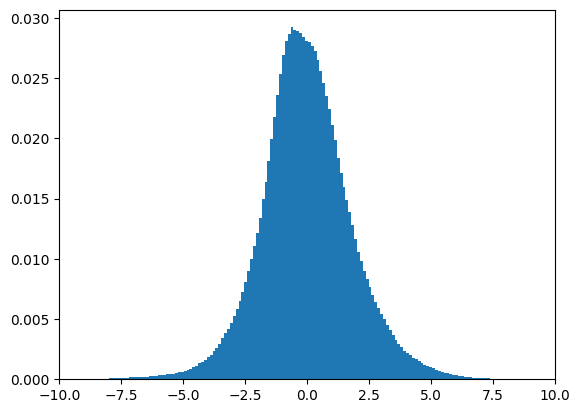

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/5_S2_simple_CNN_error_histogram_20m.npy', error)
plt.hist(error.flatten(), bins=500)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()

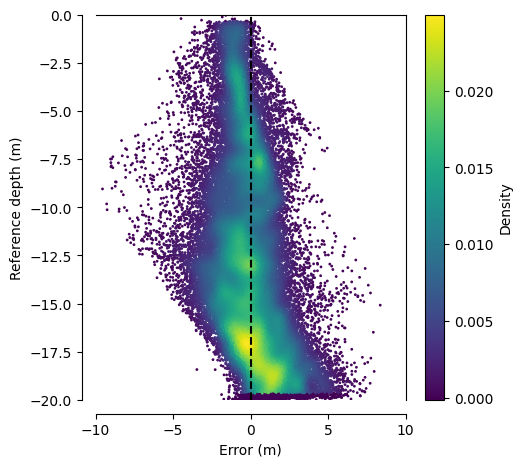

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('5_S2_simple_CNN_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

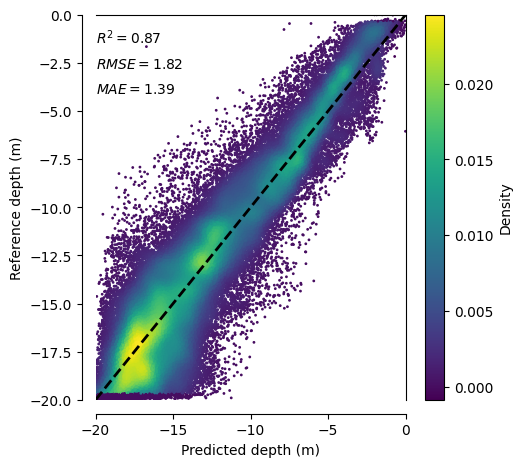

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('5_S2_simple_CNN_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.386064,1.816600,5696254
1,"[-5, 0)",1.163698,1.446080,574973
2,"[-10, -5)",1.163746,1.622506,1092649
3,"[-15, -10)",1.450025,1.886761,1733603
4,"[-20, -15)",1.499304,1.929878,2295029


# 6: PRISMA CNN

## PRISMA CNN unlimited

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/6_PRISMA_2D_3D_CNN_reference_new.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/6_PRISMA_2D_3D_CNN_median_new.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/6_PRISMA_2D_3D_CNN_error_new.npy')
df3 = pd.read_csv('/content/drive/MyDrive/Predictions_final/6_PRISMA_2D_3D_CNN_dataframe_new.csv')



In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.7382862686918497
MAE: 1.7679672562148765
R2: 0.8545731735326758


In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

MAE: 1.7678243364534665
RMSE 2.7375122860784327
R2: 0.8546547632157219


In [ ]:
mask = ~np.isnan(depth.flatten())
non_nan_predictions = depth.flatten()[mask]
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)
(num_predictions_gt_0/len(non_nan_predictions))*100
# 0.68% of the pixels predicted larger than 0

Number of predictions greater than 0: 953


0.10706782460200655

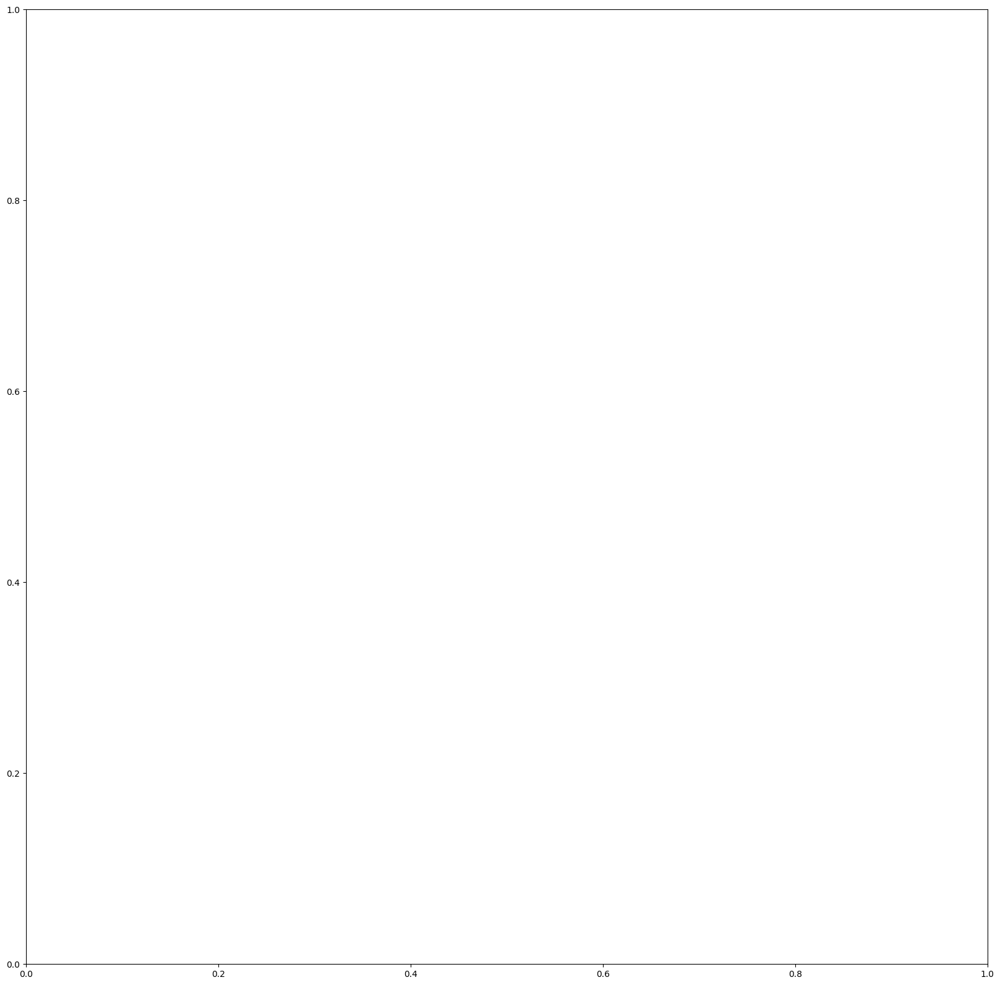

In [ ]:
mask = depth > 0
fig, ax = plt.subplots(figsize=(20, 20))
#plt.imshow(mask)
#plt.show()

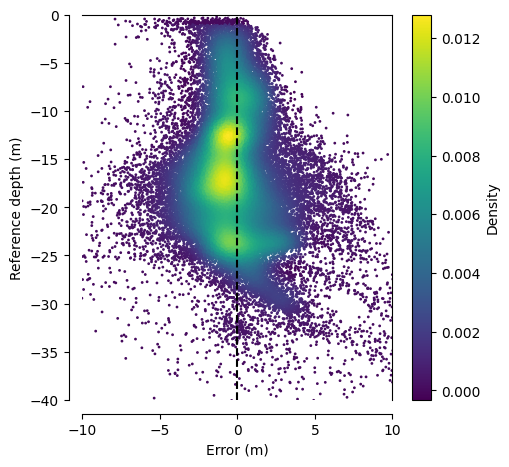

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('6_PRISMA_2D3D_CNN_depth_vs_error_new.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

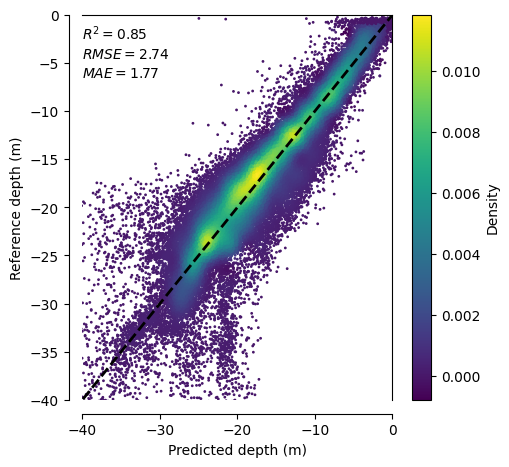

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('6_PRISMA_2D3D_CNN_depth_vs_predicted_new.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-135-a22c0a17cdd5>:11: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-135-a22c0a17cdd5>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-135-a22c0a17cdd5>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

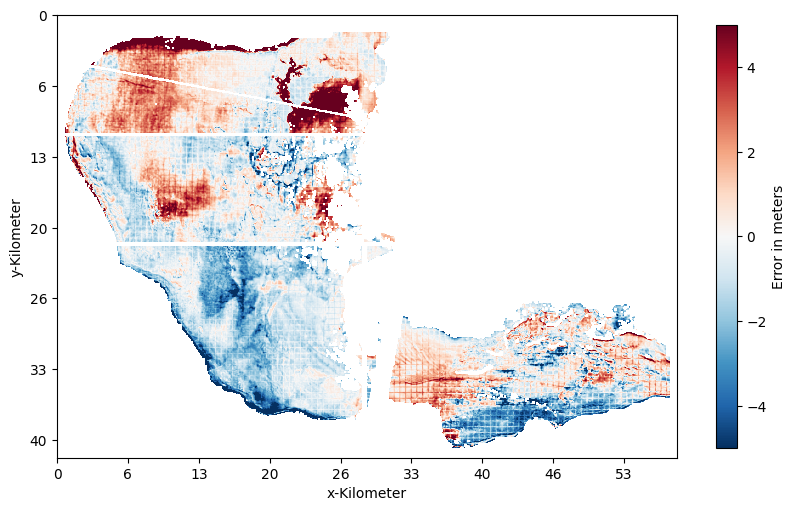

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_PRISMA_CNN_unl.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[50:-100, 50:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('6_PRISMA_2D3D_CNN_error_map_new.png', bbox_inches='tight', dpi=300)
files.download('6_PRISMA_2D3D_CNN_error_map_new.png')



<ipython-input-136-3538a4802c3c>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-136-3538a4802c3c>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

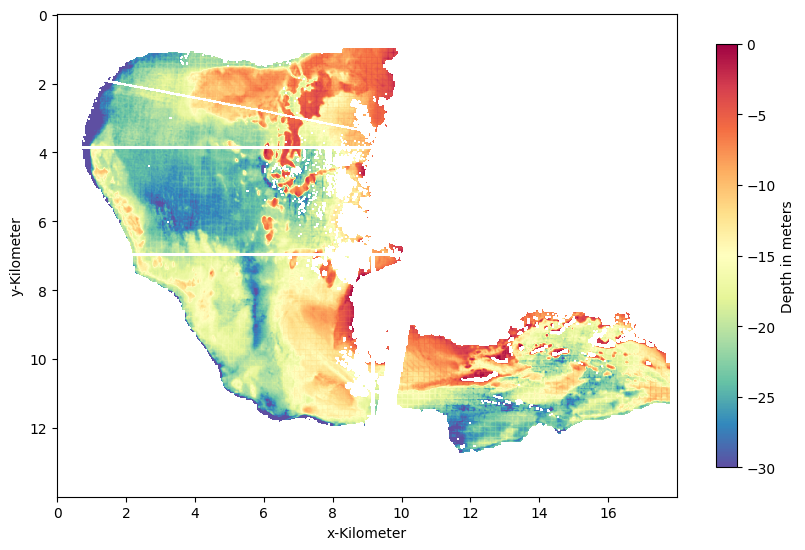

In [ ]:

norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('6_PRISMA_2D3D_CNN_depth_map_new.png', bbox_inches='tight', dpi=300)
files.download('6_PRISMA_2D3D_CNN_depth_map_new.png')


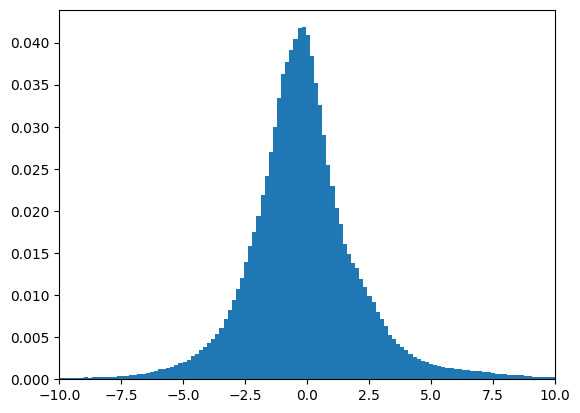

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/6_S2_PRISMA_CNN_error_histogram_new.npy', error)
plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.767824,2.737512,889132
1,"[-5, 0)",1.091118,1.578720,49419
2,"[-10, -5)",0.888238,1.318670,111317
3,"[-15, -10)",1.277241,1.740655,173069
4,"[-20, -15)",1.930006,2.644975,245856
5,"[-25, -20)",1.972615,2.785563,216892
6,"[-30, -25)",1.964023,2.928527,65211
7,"[-35, -30)",4.433980,5.753912,18866
8,"[-40, -35)",8.610658,10.500793,5849


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,1.767824,2.737512,889132
1,"[-20.0, 0.0)",1.463532,2.101968,579661
2,"[-30.0, -20.0)",1.970629,2.819255,282103
3,"[-inf, -30.0)",6.122355,8.243550,27368


## PRISMA CNN max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/PRISMA_2D_3D_CNN_reference_new.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/PRISMA_2D_3DCNN_median_new.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/PRISMA_2D_3D_CNN_error_new.npy')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_PRISMA_CNN_20m_new.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-141-4ffcb9be0ed0>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


In [ ]:
rmse, mae, r2,df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 1.5900645385297179
MAE: 1.1142980317079236
R2: 0.8951828515892075


In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

MAE: 1.1142980317079236
RMSE 1.5900645385297179
R2: 0.8951828515892075


In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


Number of predictions greater than 0: 783


In [ ]:
mask = ~np.isnan(depth.flatten())
non_nan_predictions = depth.flatten()[mask]
len(non_nan_predictions)
(1574/570244)*100
# 0.27% of the pixels predicted larger than 0

0.27602219400817896

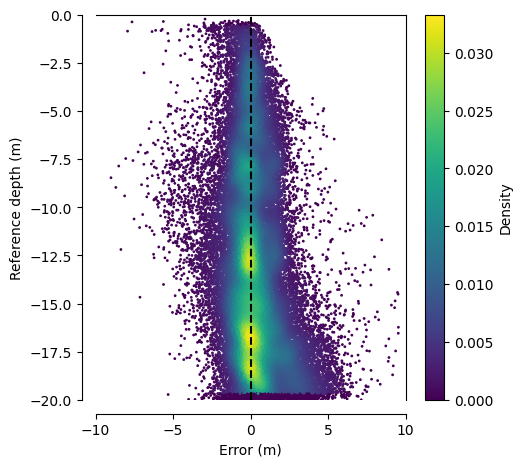

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('6_PRISMA_2D3D_CNN_depth_vs_error_20m_new.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
# predictions = np.array(predictions)
# y_test = np.array(reference)
# print(predictions.shape)

# # Calculate the RMSE
# rmse = np.sqrt(np.nanmean((predictions - y_test) ** 2))
# print('RMSE:', rmse)

# y_test_flat = y_test.flatten()
# predictions_flat = predictions.flatten()
# df_pred = pd.DataFrame(predictions_flat)
# df_test = pd.DataFrame(y_test_flat)
# df = pd.concat([df_test, df_pred], axis =1)
# df2 = df.dropna() # Remove NaN values
# df2.columns = ['Reference','Predicted']
# df2= df2[df2['Reference'] < 0] # set max ref depth
# df2= df2[df2['Predicted'] > -50] # set max ref depth
# df2= df2[df2['Predicted'] < 0] # set max ref depth

# #df2= df2[df2['Reference'] > -10] # set max ref depth
# #df2 = df2.dropna() # Remove NaN values
# df3 = df2.reset_index(drop=True)
# df3['Error'] = df3['Predicted'] - df3['Reference']
# df3
# # Metrics
# rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
# r2 = metrics.r2_score(df3.Reference, df3.Predicted)
# mae = np.mean(abs(df3.Reference - df3.Predicted))
# print('MAE:',mae)
# print('RMSE', rmse)
# print('R2:',r2)

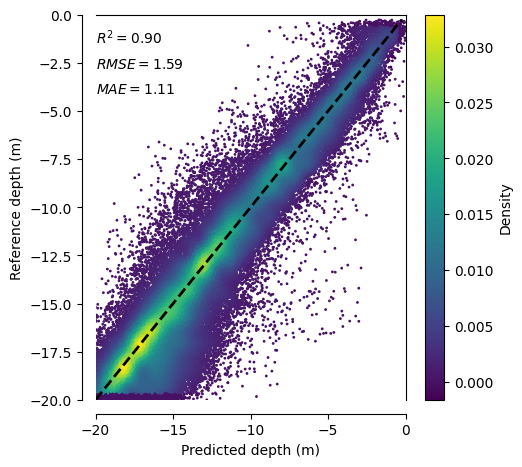

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('6_PRISMA_2D3D_CNN_depth_vs_predicted_20m_new.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-149-b764b7304766>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-149-b764b7304766>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

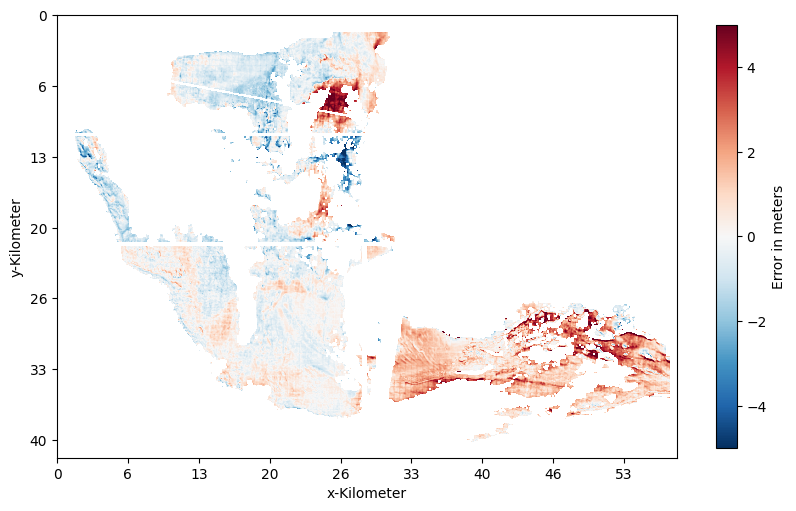

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference
error = error[50:-100, 50:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 30)) for x in ax.get_xticks()]
yticks = [str(int(y // 30)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('6_PRISMA_2D3D_CNN_error_map_20m_new.png', bbox_inches='tight', dpi=300)
files.download('6_PRISMA_2D3D_CNN_error_map_20m_new.png')



<ipython-input-150-b517d309da7b>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-150-b517d309da7b>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

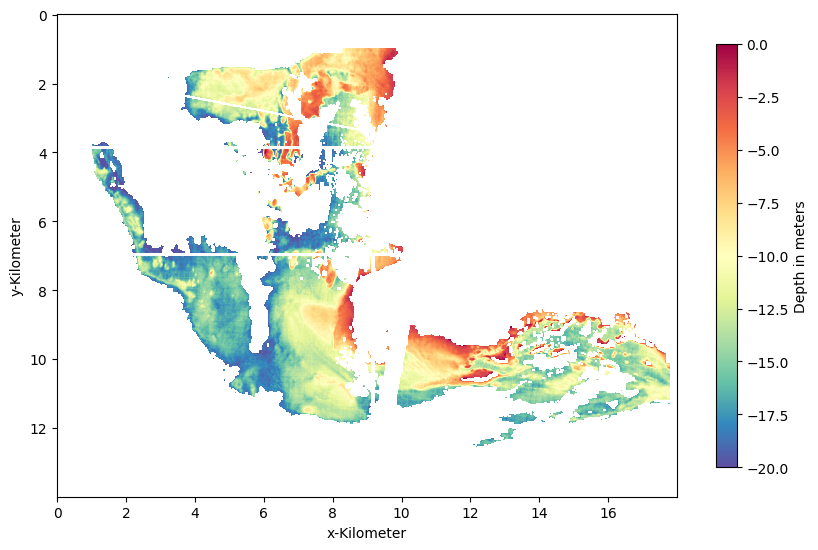

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('6_PRISMA_2D3D_CNN_depth_map_20m_new.png', bbox_inches='tight', dpi=300)
files.download('6_PRISMA_2D3D_CNN_depth_map_20m_new.png')

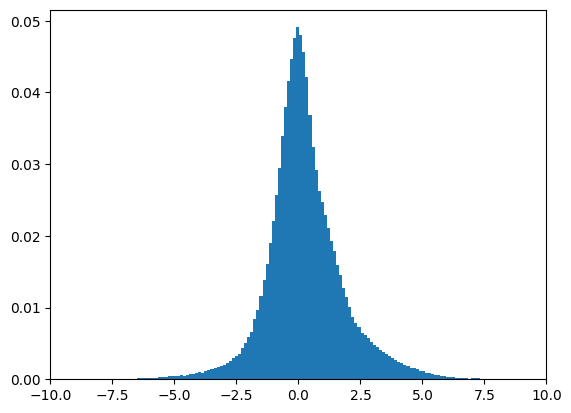

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/6_S2_PRISMA_CNN_error_histogram_20m_new.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
unique_values = np.unique(error)
num_unique_values = len(unique_values)

print("Unique values:", unique_values)
print("Number of unique values:", num_unique_values)

Unique values: [-12.3167181  -12.09925795 -11.87096404 ...  47.82701978  48.17147904
  49.43125418]
Number of unique values: 542457


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.114298,1.590065,569461
1,"[-5, 0)",0.718413,1.084443,49498
2,"[-10, -5)",1.011494,1.428311,110942
3,"[-15, -10)",1.019380,1.427659,172416
4,"[-20, -15)",1.314489,1.843168,236605


# 7: UNet S2

## 7: UNet S2 unlimited

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_predictions.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_error.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std.npy')


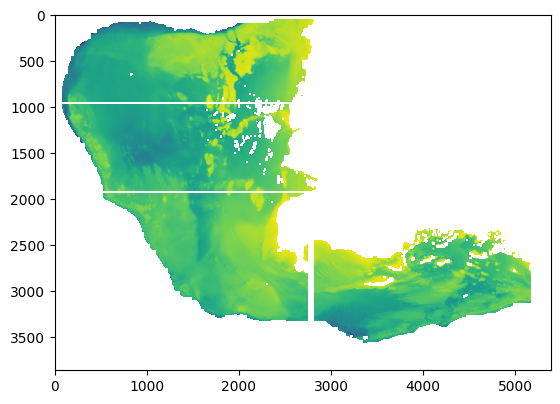

In [ ]:
plt.imshow(reference)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.723629687877446
MAE: 1.8073237090889396
R2: 0.8624557937103641


In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

MAE: 1.807357848011482
RMSE 2.723721441625098
R2: 0.8623714535661087


In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


Number of predictions greater than 0: 20970


In [ ]:
import numpy as np
# reference & std

# Mask NaN values
mask = ~np.isnan(reference) & ~np.isnan(std)
reference_masked = reference[mask]
std_predictions_masked = std[mask]

# Calculate correlation coefficient
corr_coef = np.corrcoef(reference_masked, std_predictions_masked)[0, 1]

print("Correlation coefficient:", corr_coef)

Correlation coefficient: -0.4459461850786969


In [ ]:
import statsmodels.api as sm

# Create masks for the std and error_abs arrays
std_mask = std.copy()
std_mask[std_mask > 0] = 1  # Set all non-negative values to 1
std_mask[std_mask < 0] = 1  # Set all non-positive values to 1
std_mask[std_mask == 0] = 1  # Set all zero values to 1

reference_mask = reference.copy()
reference_mask[reference_mask > 0] = 1  # Set all non-negative values to 1
reference_mask[reference_mask < 0] = 1  # Set all non-positive values to 1
reference_mask[reference_mask == 0] = 1  # Set all zero values to 1

# Create masked versions of the std and error_abs arrays
reference_masked = reference * std_mask
std_masked = std * reference_mask

# Flatten the masked arrays and remove any NaN values
std_masked_flat = std_masked.flatten()
std_masked_no_nan = std_masked_flat[~np.isnan(std_masked_flat)]

reference_masked_flat = reference_masked.flatten()
reference_masked_no_nan = reference_masked_flat[~np.isnan(reference_masked_flat)]

# Add a constant term to the predictor
reference_masked_no_nan = sm.add_constant(reference_masked_no_nan)

# Create the linear regression model
model = sm.OLS(std_masked_no_nan, reference_masked_no_nan)

# Fit the model
results = model.fit()

# Print the summary of the regression results
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.199
Model:                            OLS   Adj. R-squared:                  0.199
Method:                 Least Squares   F-statistic:                 2.142e+06
Date:                Mon, 03 Jul 2023   Prob (F-statistic):               0.00
Time:                        15:08:28   Log-Likelihood:            -9.1102e+06
No. Observations:             8627037   AIC:                         1.822e+07
Df Residuals:                 8627035   BIC:                         1.822e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2103      0.001   2054.363      0.0

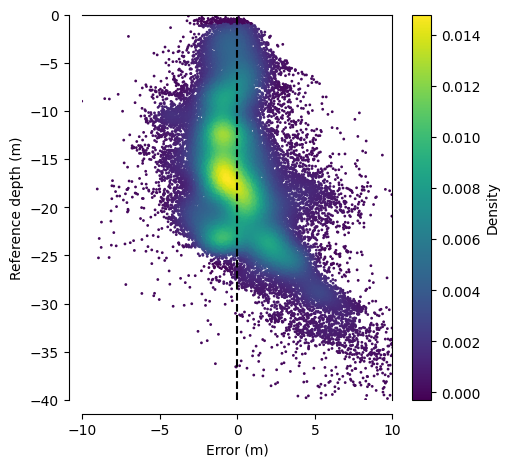

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

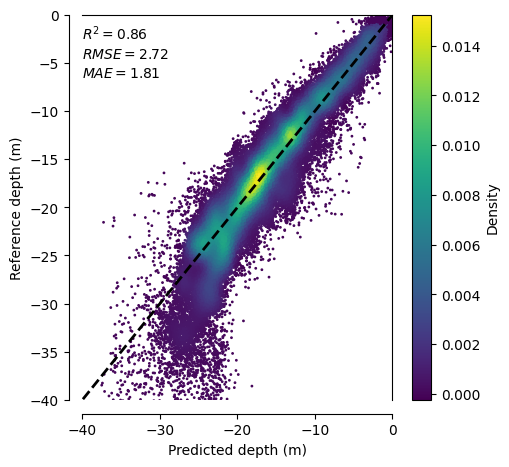

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-34-165500e10e49>:10: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-34-165500e10e49>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-34-165500e10e49>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

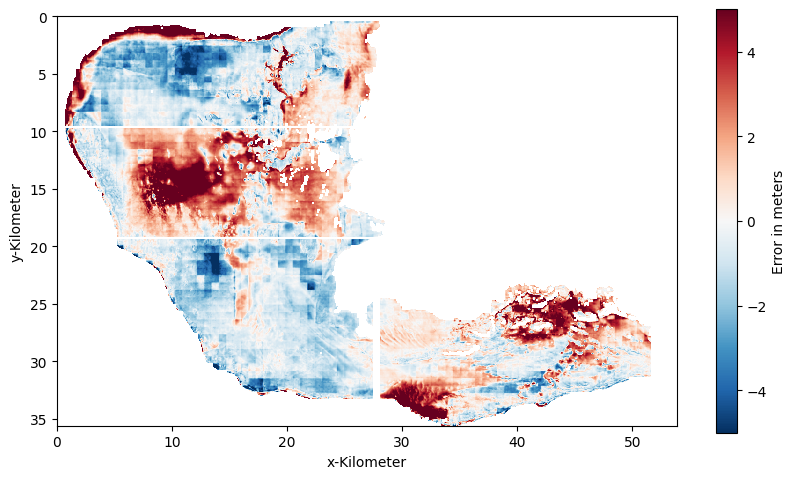

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_UNet.tif'
# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_error_map.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_error_map.png')



<ipython-input-36-c69da3125b83>:10: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-36-c69da3125b83>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-36-c69da3125b83>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

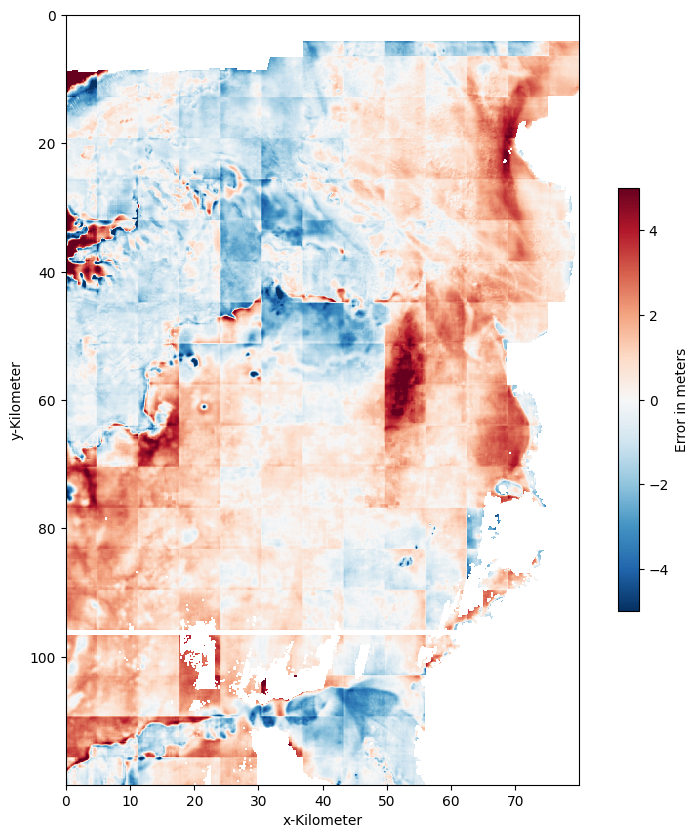

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_UNet.tif'
# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
error_small = error[0:1200,2000:2800]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error_small, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 10)) for x in ax.get_xticks()]
yticks = [str(int(y // 10)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_error_map_small.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_error_map_small.png')

<ipython-input-16-aeb3e8a8549d>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-16-aeb3e8a8549d>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

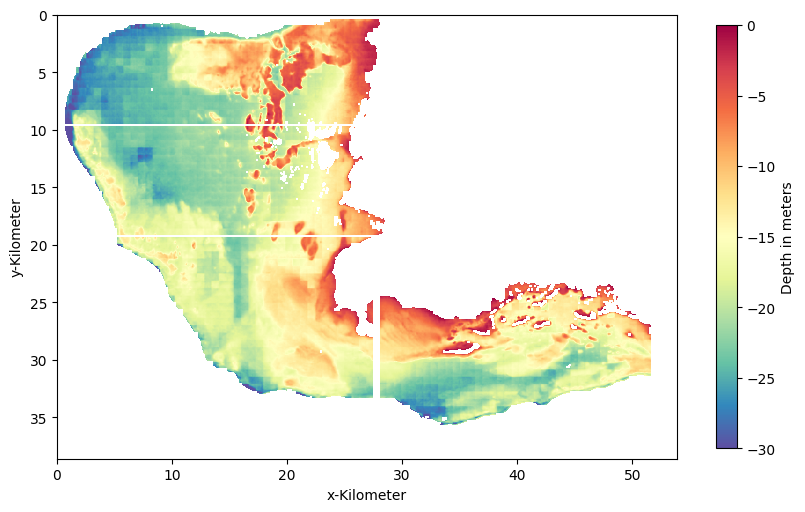

In [ ]:

norm = mcolors.TwoSlopeNorm(vmin=-30, vmax = 0, vcenter=-15)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Depth in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_depth_map.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_depth_map.png')

<ipython-input-17-0c18664adee9>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-17-0c18664adee9>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

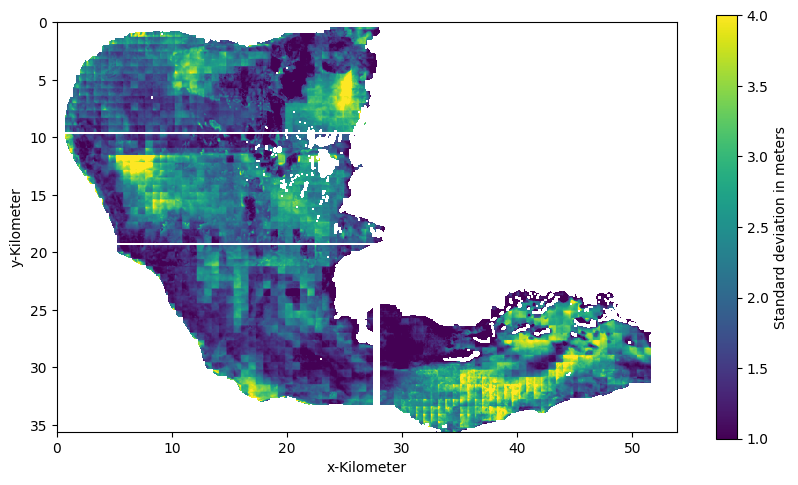

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=1, vmax = 4, vcenter=2.5)
fig, ax = plt.subplots(figsize=(10, 10))
std2 = std[:-300,:]
pc = ax.imshow(std2, norm=norm, cmap="viridis")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Standard deviation in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
plt.savefig('7_UNet_std_map.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_std_map.png')

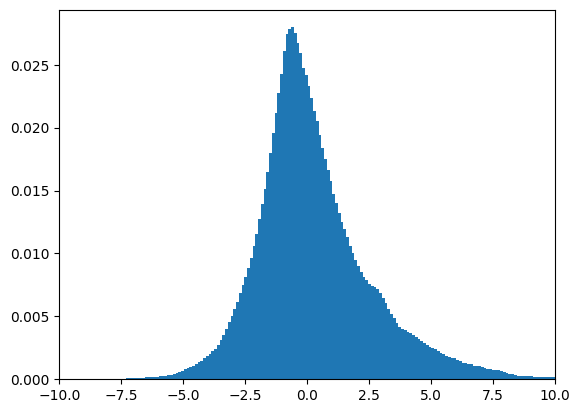

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/7_UNet_error_histogram.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.807358,2.723721,8605013
1,"[-5, 0)",0.918128,1.171699,531398
2,"[-10, -5)",1.167840,1.539969,1082561
3,"[-15, -10)",1.404901,1.853289,1721457
4,"[-20, -15)",1.463881,1.995928,2328222
5,"[-25, -20)",1.716005,2.140433,2019430
6,"[-30, -25)",3.385245,3.805538,632221
7,"[-35, -30)",6.058610,6.455676,198690
8,"[-40, -35)",10.124770,10.818361,60918


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,1.807358,2.723721,8605013
1,"[-20.0, 0.0)",1.338162,1.806575,5663638
2,"[-30.0, -20.0)",2.113994,2.634772,2651651
3,"[-inf, -30.0)",8.172936,9.643829,289724


### Low std (< 2.5m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_predictions.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_error.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std.npy')


[ 1. nan]
[ 2152925 18648615]


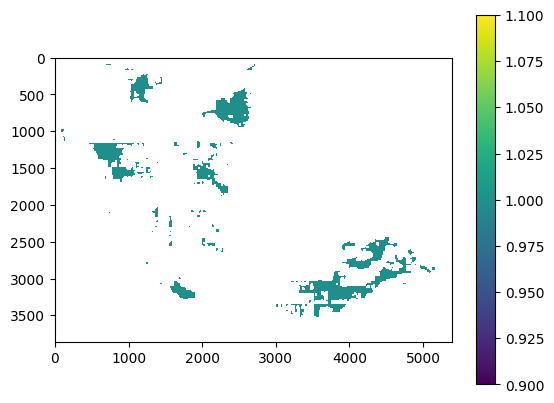

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 2.5, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

[ 1. nan]
[ 6474293 14327247]


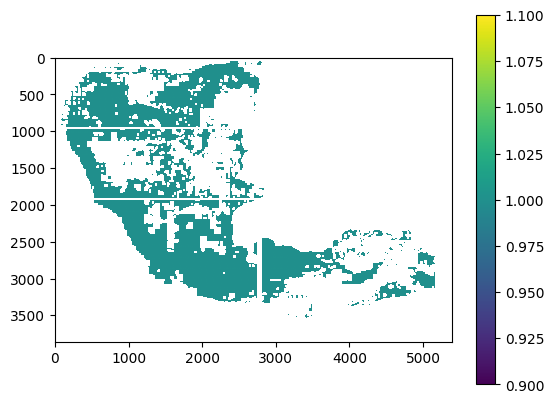

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 2.5, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 2.5) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

24.955031853837472


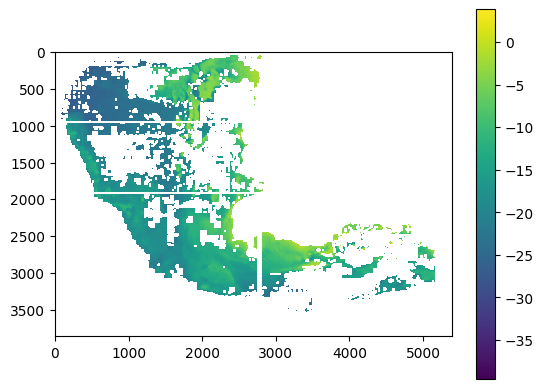

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

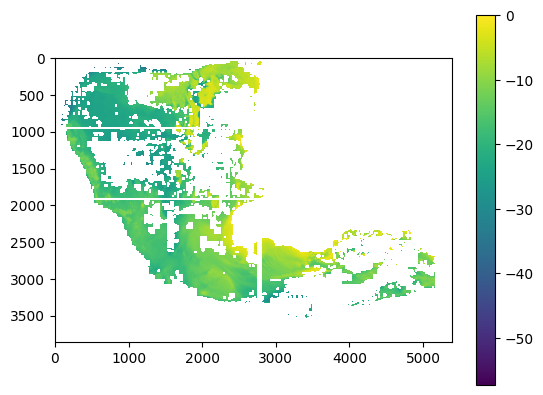

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 2.323301880675696
MAE: 1.5126392837974136
R2: 0.8943357699553188


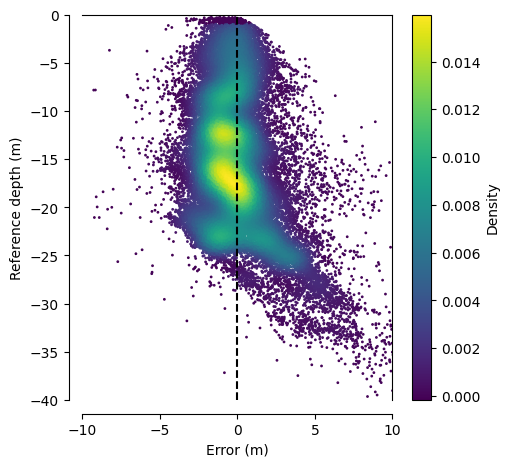

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_low_std_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

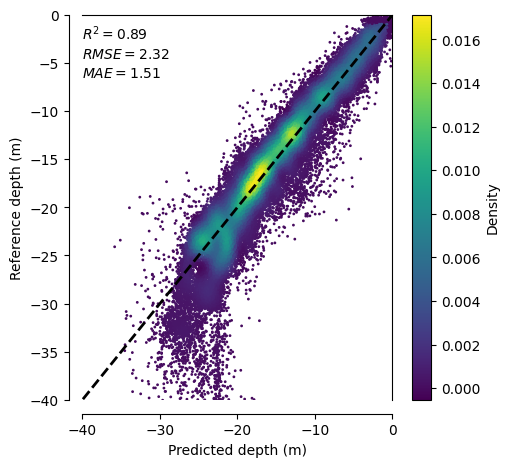

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_low_std_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-30-7d3e3d9ec75f>:11: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-30-7d3e3d9ec75f>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-30-7d3e3d9ec75f>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

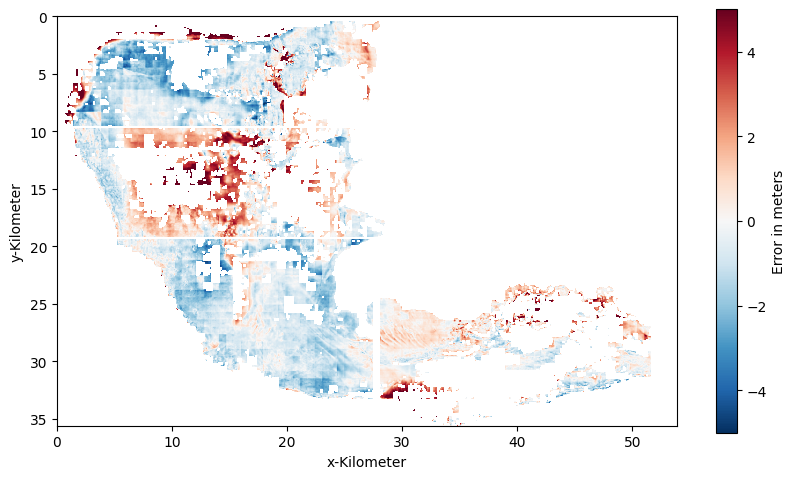

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_Unet_2_5m_std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_low_std_error_map.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_low_std_error_map.png')



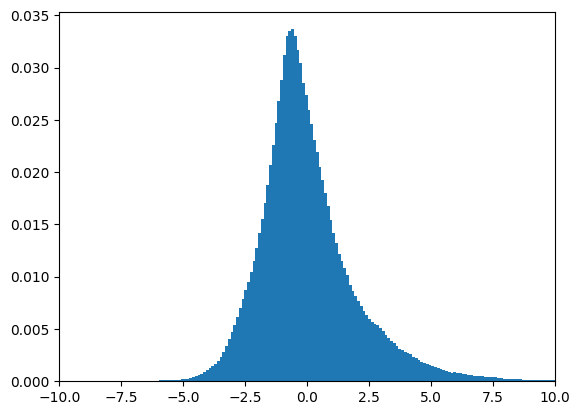

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/7_UNet_error_histogram_2_5_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-50, -45, -40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.512635,2.323371,6452260
1,"[-5, 0)",0.912536,1.165003,524504
2,"[-10, -5)",1.084780,1.418622,947196
3,"[-15, -10)",1.205188,1.551703,1418263
4,"[-20, -15)",1.207870,1.659234,1667421
5,"[-25, -20)",1.617271,1.995476,1445981
6,"[-30, -25)",3.382186,3.800492,324717
7,"[-35, -30)",5.975356,6.450071,84617
8,"[-40, -35)",11.906495,12.364382,27215
9,"[-45, -40)",18.185401,18.513494,7925


In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


,Reference Depth,MAE,RMSE,Reference
0,Total,1.512635,2.323371,6452260
1,"[-20.0, 0.0)",1.147463,1.526776,4557384
2,"[-30.0, -20.0)",1.940927,2.429085,1770698
3,"[-inf, -30.0)",8.807445,10.525898,124178


## 7: UNet S2 max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_reference_20m_v2.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_median_predictions_20m_v2.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_error_20m_v2.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_20m_v2.npy')


In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_UNet_20m_v2.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

<ipython-input-202-6f83fc99e8ac>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)


In [ ]:
std_error.shape

(3860, 5389)

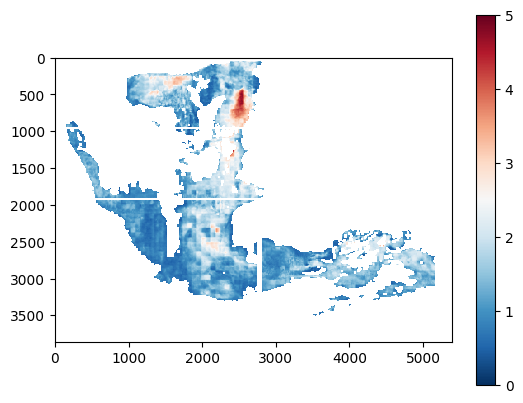

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 5, vcenter=2.5)
pc = plt.imshow(std_error, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

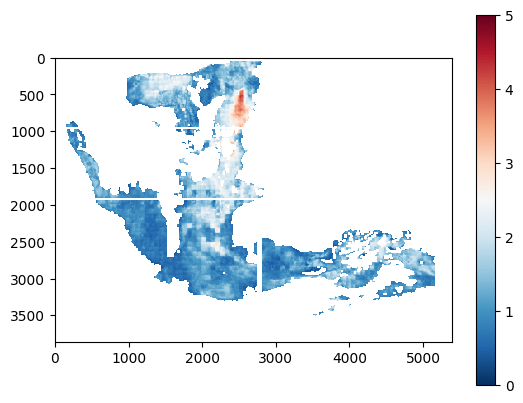

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=0, vmax = 5, vcenter=2.5)
pc = plt.imshow(std, norm=norm, cmap="RdBu_r")
plt.colorbar(pc)

<ipython-input-206-4316f83ab60d>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-206-4316f83ab60d>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

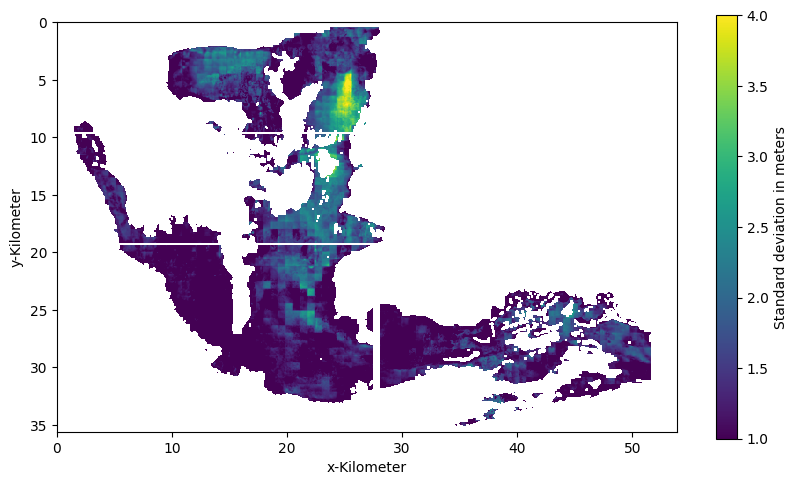

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=1, vmax = 4, vcenter=2.5)
fig, ax = plt.subplots(figsize=(10, 10))
std2 = std[:-300,:]
pc = ax.imshow(std2, norm=norm, cmap="viridis")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Standard deviation in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')


plt.savefig('7_UNet_std_map_20m.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_std_map_20m.png')

<ipython-input-207-5c362538b960>:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-207-5c362538b960>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

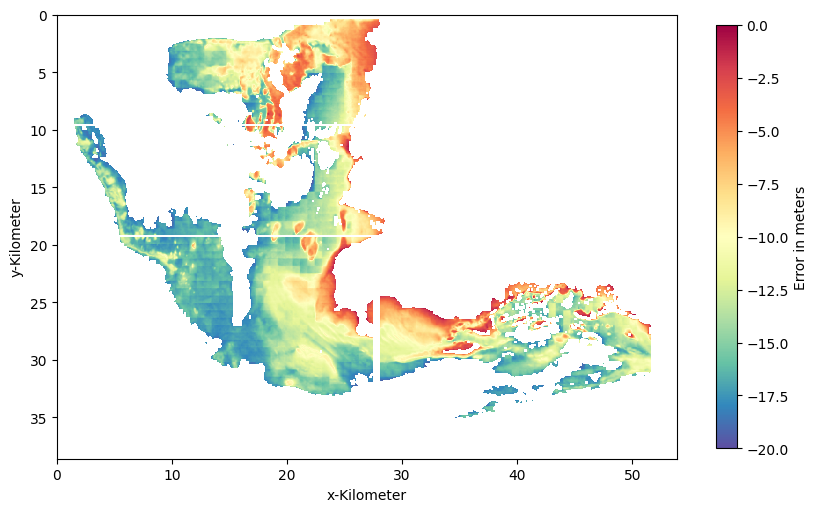

In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=-20, vmax = 0, vcenter=-10)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(depth, norm=norm, cmap="Spectral_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_depth_map_20m.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_depth_map_20m.png')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/std_UNet_20m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, std, photometric='minisblack', metadata=None)

<ipython-input-208-068071d100e2>:6: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, std, photometric='minisblack', metadata=None)


In [ ]:
import numpy as np

# Mask NaN values
mask = ~np.isnan(std_error) & ~np.isnan(std)
std_errors_masked = std_error[mask]
std_predictions_masked = std[mask]

# Calculate correlation coefficient
corr_coef = np.corrcoef(std_errors_masked, std_predictions_masked)[0, 1]

print("Correlation coefficient:", corr_coef)


Correlation coefficient: 0.8834308581780876


In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_reference_20m_v2.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_predictions_20m_v2.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_error_20m_v2.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_20m_v2.npy')

In [ ]:
import numpy as np
error_abs = abs(error)
# Mask NaN values
mask = ~np.isnan(error_abs) & ~np.isnan(std)
std_errors_masked = error_abs[mask]
std_predictions_masked = std[mask]

# Calculate correlation coefficient
corr_coef = np.corrcoef(std_errors_masked, std_predictions_masked)[0, 1]

print("Correlation coefficient:", corr_coef)

Correlation coefficient: 0.3019500321752184


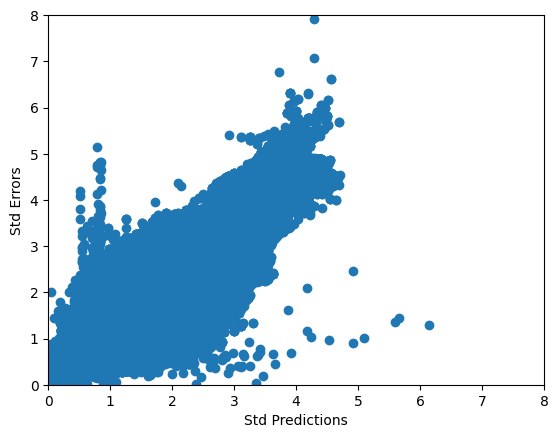

In [ ]:
import matplotlib.pyplot as plt

# Mask NaN values
mask = ~np.isnan(std_error) & ~np.isnan(std)
std_errors = std_error[mask]
std_predictions = std[mask]

# Plot the data
plt.scatter(std_predictions, std_errors)
plt.xlim(0, 8)
plt.ylim(0, 8)
plt.xlabel('Std Predictions')
plt.ylabel('Std Errors')
plt.show()


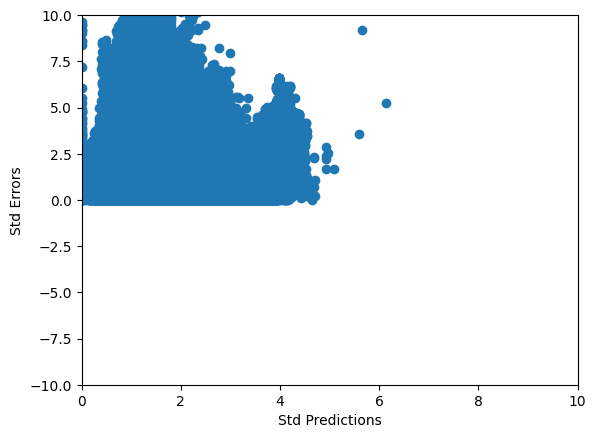

In [ ]:
import matplotlib.pyplot as plt

# Mask NaN values
mask = ~np.isnan(error_abs) & ~np.isnan(std)
std_errors = error_abs[mask]
std_predictions = std[mask]

# Plot the data
plt.scatter(std_predictions, std_errors)
plt.xlim(0, 10)
plt.ylim(-10, 10)
plt.xlabel('Std Predictions')
plt.ylabel('Std Errors')
plt.show()

In [ ]:
import numpy as np

# Assuming `std_error` and `std_predictions` are the arrays you have
mask = ~np.isnan(std_error) & ~np.isnan(std)
mask = mask & (std_error >= 0) & (std >= 0) # to ensure values are non-negative
same_count = np.count_nonzero(np.isclose(std_error[mask], std[mask]))

print("Number of pixels where std error and std prediction is the same:", same_count)


Number of pixels where std error and std prediction is the same: 572


In [ ]:
print("Number of non-NaN values in 'std' array:", np.count_nonzero(~np.isnan(std)))
print("Number of non-NaN values in 'error_abs' array:", np.count_nonzero(~np.isnan(error_abs)))


Number of non-NaN values in 'std' array: 5574284
Number of non-NaN values in 'error_abs' array: 5574103


In [ ]:
import statsmodels.api as sm

# Create masks for the std and error_abs arrays
std_mask = std.copy()
std_mask[std_mask > 0] = 1  # Set all non-negative values to 1
std_mask[std_mask < 0] = 1  # Set all non-positive values to 1
std_mask[std_mask == 0] = 1  # Set all zero values to 1

error_abs = abs(error)
error_abs_mask = error_abs.copy()
error_abs_mask[error_abs_mask > 0] = 1  # Set all non-negative values to 1
error_abs_mask[error_abs_mask < 0] = 1  # Set all non-positive values to 1
error_abs_mask[error_abs_mask == 0] = 1  # Set all zero values to 1

# Create masked versions of the std and error_abs arrays
error_abs_masked = error_abs * std_mask
std_masked = std * error_abs_mask

# Flatten the masked arrays and remove any NaN values
std_masked_flat = std_masked.flatten()
std_masked_no_nan = std_masked_flat[~np.isnan(std_masked_flat)]

error_abs_masked_flat = error_abs_masked.flatten()
error_abs_masked_no_nan = error_abs_masked_flat[~np.isnan(error_abs_masked_flat)]

# Add a constant term to the predictor
std_masked_no_nan = sm.add_constant(std_masked_no_nan)

# Create the linear regression model
model = sm.OLS(error_abs_masked_no_nan, std_masked_no_nan)

# Fit the model
results = model.fit()

# Print the summary of the regression results
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.091
Model:                            OLS   Adj. R-squared:                  0.091
Method:                 Least Squares   F-statistic:                 5.592e+05
Date:                Wed, 28 Jun 2023   Prob (F-statistic):               0.00
Time:                        13:33:57   Log-Likelihood:            -7.9529e+06
No. Observations:             5574103   AIC:                         1.591e+07
Df Residuals:                 5574101   BIC:                         1.591e+07
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4364      0.001    449.796      0.0

In [ ]:
rmse, mae, r2,df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 1.5171649662850253
MAE: 1.0877408658840992
R2: 0.9080945702218356


In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


Number of predictions greater than 0: 5991


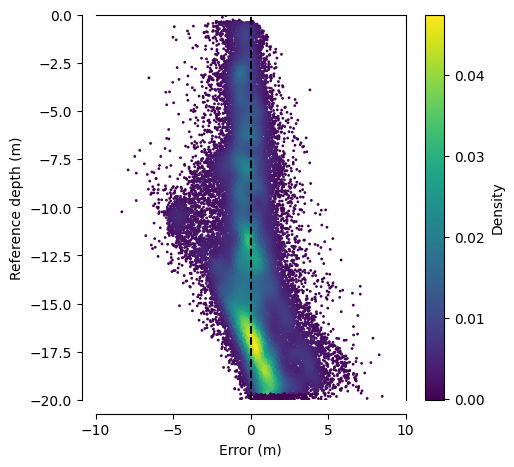

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

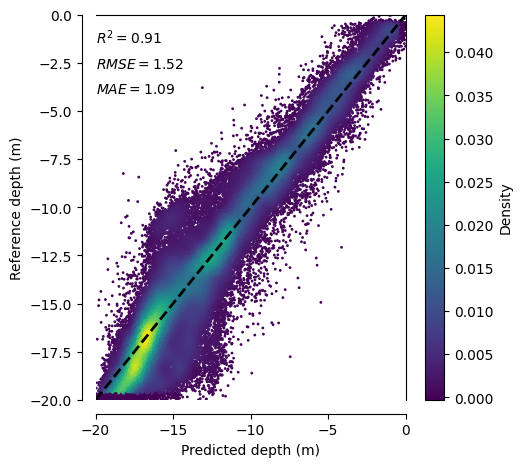

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
    #plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-221-b29cd90b0e4e>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-221-b29cd90b0e4e>:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

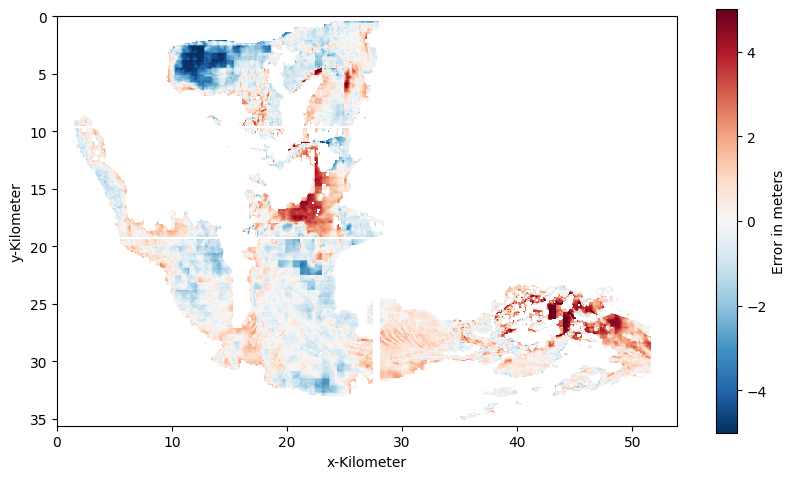

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
#error = depth - reference
error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_error_map_20m.png')



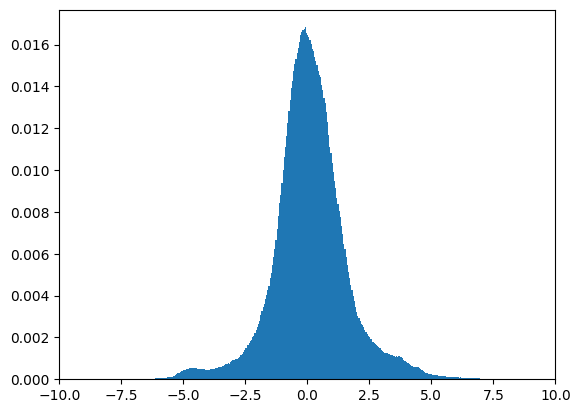

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/7_UNet_error_histogram_20m.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
np.save('/content/drive/My Drive/Predictions_final/7_UNet_error_histogram_20m.npy', error)


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.087618,1.517057,5566773
1,"[-5, 0)",0.707176,0.926887,545574
2,"[-10, -5)",0.950348,1.332765,1079532
3,"[-15, -10)",1.138862,1.575974,1712369
4,"[-20, -15)",1.207833,1.663969,2229298


In [ ]:
df3

,Reference,Predicted,Error,Squared_Error,depth_bin
0,-8.185000,-13.778653,-5.593653,31.288951,"[-10, -5)"
1,-8.036250,-13.735501,-5.699251,32.481464,"[-10, -5)"
2,-7.845000,-13.674078,-5.829078,33.978153,"[-10, -5)"
3,-7.530000,-13.674078,-6.144078,37.749698,"[-10, -5)"
4,-7.280250,-13.841516,-6.561266,43.050217,"[-10, -5)"
...,...,...,...,...,...
5566768,-19.790417,-18.353488,1.436929,2.064764,"[-20, -15)"
5566769,-19.948334,-18.610495,1.337839,1.789814,"[-20, -15)"
5566770,-19.770416,-18.588383,1.182034,1.397203,"[-20, -15)"
5566771,-19.734167,-18.588383,1.145784,1.312822,"[-20, -15)"


### Low std (< 1.5m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_reference_20m_v2.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_predictions_20m_v2.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_error_20m_v2.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_20m_v2.npy')


[ 1. nan]
[  671189 20130351]


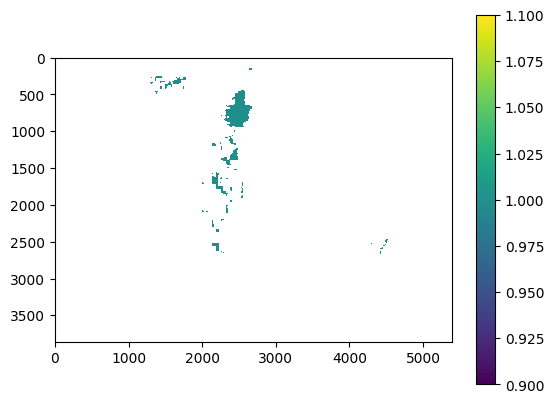

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 2, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

[ 1. nan]
[ 4013085 16788455]


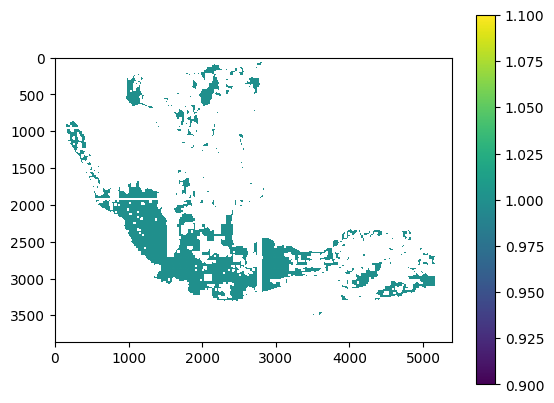

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 1.5, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 1.5) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

28.0071664809328


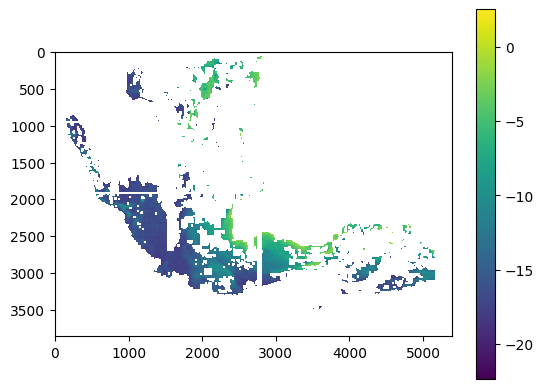

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

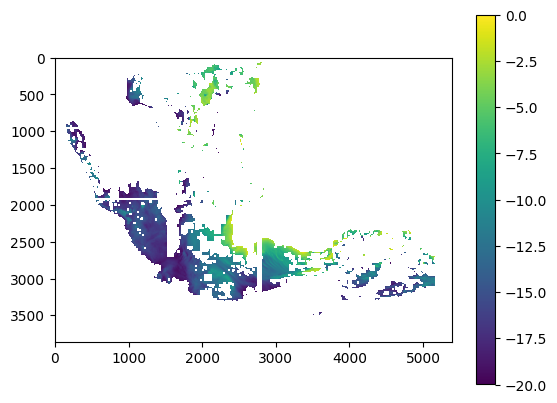

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 1.2066409522859545
MAE: 0.8817309096129542
R2: 0.9483348796947377


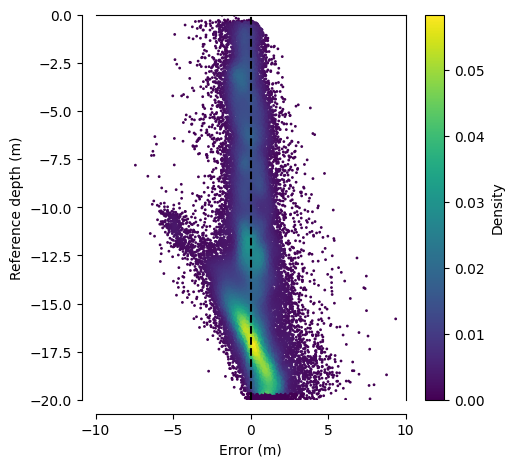

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_1_5m_std_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

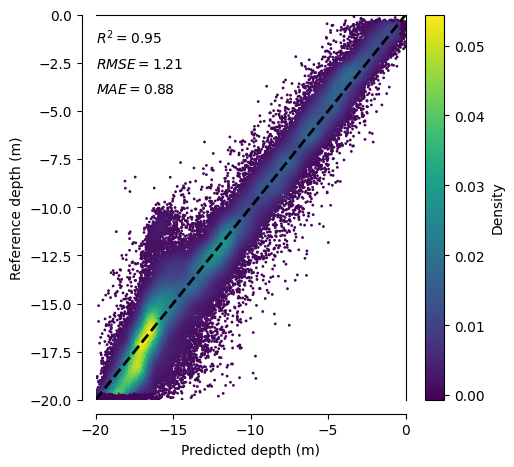

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_1_5m_std_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-235-76bb045972e7>:11: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-235-76bb045972e7>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-235-76bb045972e7>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

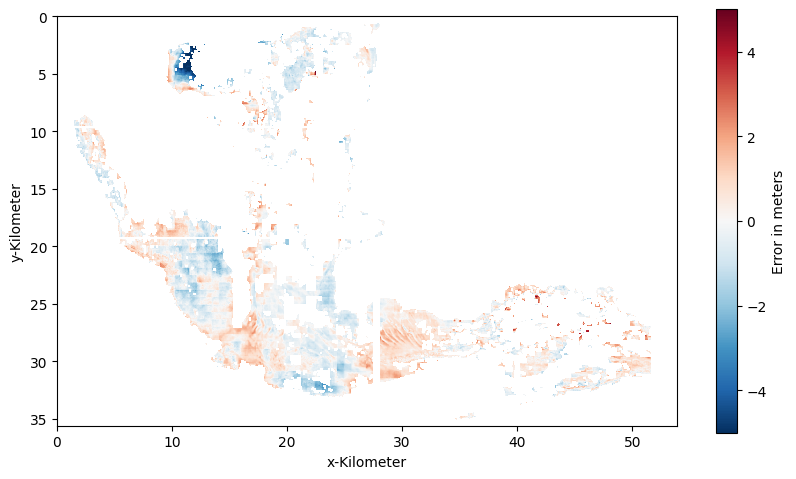

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_UNet_20m_1_5std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_1_5m_std_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_1_5m_std_error_map_20m.png')

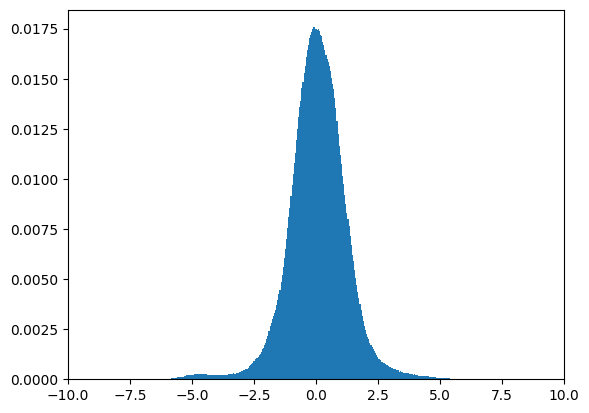

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/7_UNet_error_histogram_20m_1_5m_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,0.881508,1.206377,4005638
1,"[-5, 0)",0.688752,0.893331,518041
2,"[-10, -5)",0.720928,0.977504,646622
3,"[-15, -10)",1.017788,1.425171,1150326
4,"[-20, -15)",0.909263,1.206718,1690649


### Low std (< 2m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_reference_20m_v2.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_predictions_20m_v2.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_error_20m_v2.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/7_UNet_std_20m_v2.npy')


[ 1. nan]
[  671189 20130351]


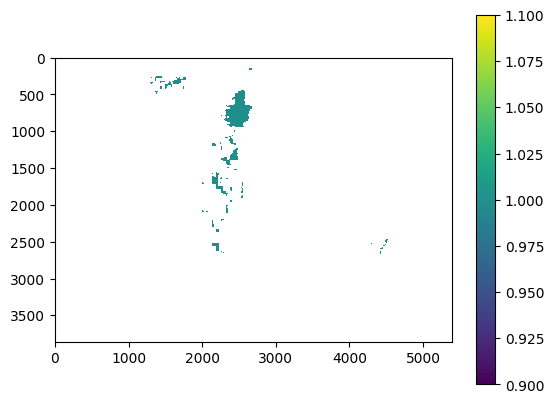

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 2, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

[ 1. nan]
[ 4903095 15898445]


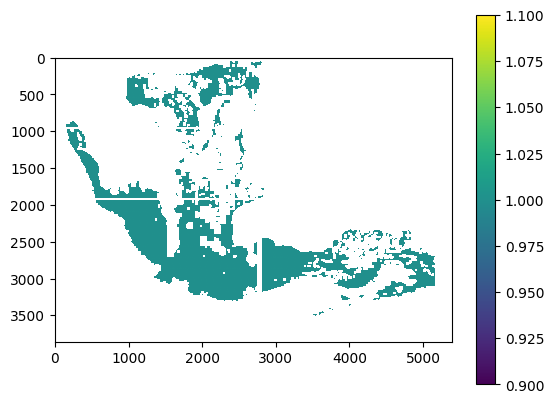

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 2, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 2) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

12.040810981284771


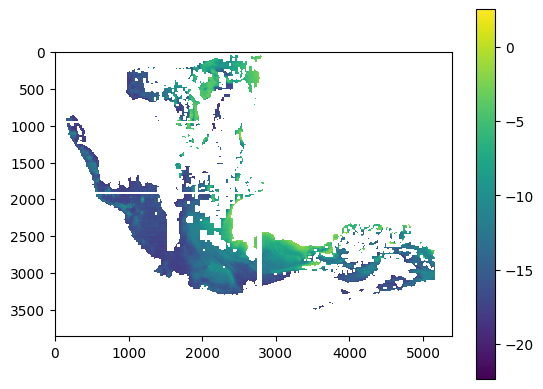

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

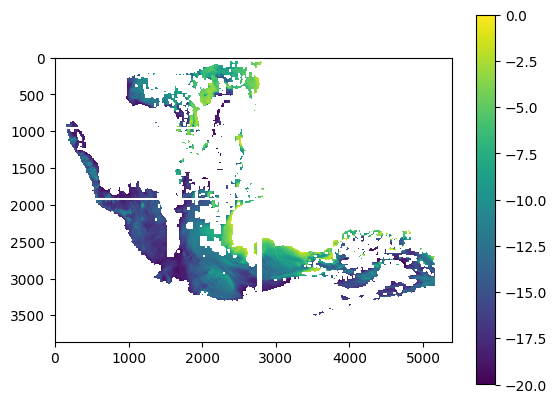

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

RMSE: 1.4070870165457694
MAE: 1.0069104485561027
R2: 0.9247410399887656


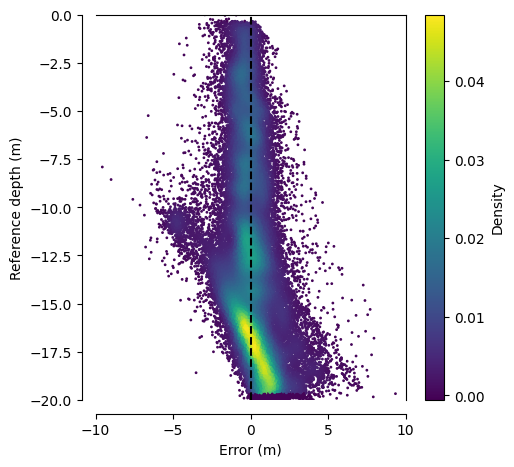

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_2m_std_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

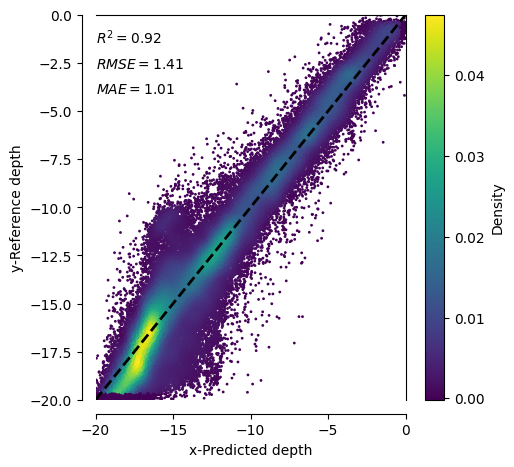

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("x-Predicted depth")
    ax.set_ylabel("y-Reference depth")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
   # plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('7_UNet_2m_std_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

<ipython-input-247-3ddbd2743b61>:11: DeprecationWarning: <tifffile.imsave> is deprecated. Use tifffile.imwrite
  tiff.imsave(filename, error, photometric='minisblack', metadata=None)
<ipython-input-247-3ddbd2743b61>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks)
<ipython-input-247-3ddbd2743b61>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

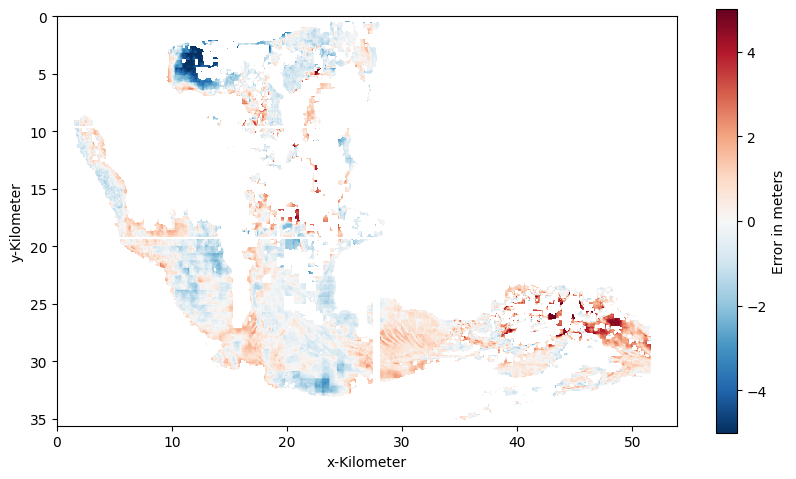

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_UNet_20m_2m_std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('7_UNet_2m_std_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('7_UNet_2m_std_error_map_20m.png')



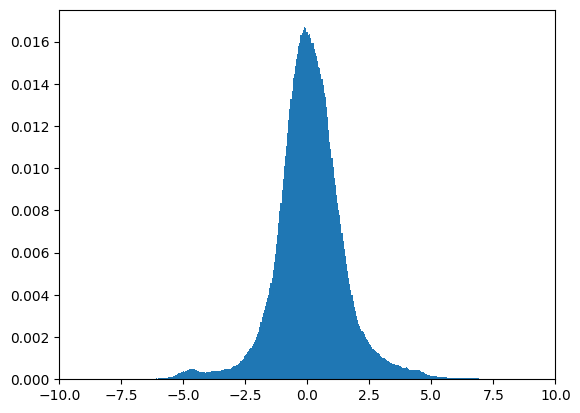

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/7_UNet_error_histogram_20m_2m_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

,Reference Depth,MAE,RMSE,Reference
0,Total,1.006759,1.406949,4895623
1,"[-5, 0)",0.700614,0.912990,538613
2,"[-10, -5)",0.804483,1.122258,857990
3,"[-15, -10)",1.115428,1.556860,1479444
4,"[-20, -15)",1.094735,1.505173,2019576


# 8: Sentinel-2 CNN on each image

## 8: Sentinel-2 CNN on each image unlimited

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std_error.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std.npy')

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


In [ ]:
import numpy as np
# reference & std

# Mask NaN values
mask = ~np.isnan(reference) & ~np.isnan(std)
reference_masked = reference[mask]
std_predictions_masked = std[mask]

# Calculate correlation coefficient
corr_coef = np.corrcoef(reference_masked, std_predictions_masked)[0, 1]

print("Correlation coefficient:", corr_coef)

In [ ]:
reference_masked.shape

In [ ]:
std_predictions_masked.shape

In [ ]:
import statsmodels.api as sm

# Create masks for the std and error_abs arrays
std_mask = std.copy()
std_mask[std_mask > 0] = 1  # Set all non-negative values to 1
std_mask[std_mask < 0] = 1  # Set all non-positive values to 1
std_mask[std_mask == 0] = 1  # Set all zero values to 1

reference_mask = reference.copy()
reference_mask[reference_mask > 0] = 1  # Set all non-negative values to 1
reference_mask[reference_mask < 0] = 1  # Set all non-positive values to 1
reference_mask[reference_mask == 0] = 1  # Set all zero values to 1

# Create masked versions of the std and error_abs arrays
reference_masked = reference * std_mask
std_masked = std * reference_mask

# Flatten the masked arrays and remove any NaN values
std_masked_flat = std_masked.flatten()
std_masked_no_nan = std_masked_flat[~np.isnan(std_masked_flat)]

reference_masked_flat = reference_masked.flatten()
reference_masked_no_nan = reference_masked_flat[~np.isnan(reference_masked_flat)]

# Add a constant term to the predictor
reference_masked_no_nan = sm.add_constant(reference_masked_no_nan)

# Create the linear regression model
model = sm.OLS(std_masked_no_nan, reference_masked_no_nan)

# Fit the model
results = model.fit()

# Print the summary of the regression results
print(results.summary())


In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each.tif'
# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 10)) for x in ax.get_xticks()]
yticks = [str(int(y // 10)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_error_map.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_error_map.png')



In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=1, vmax = 5, vcenter=3)
fig, ax = plt.subplots(figsize=(10, 10))
std2 = std[:-300,:]
pc = ax.imshow(std2, norm=norm, cmap="viridis")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Standard deviation in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
plt.savefig('8_S2_CNN_all_std_map.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_std_map.png')

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-50, -45, -40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


### Low std (< 3m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std_error.npy')

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 3, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 3, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 3) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each_3m_std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_low_std_error_map.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_low_std_error_map.png')



In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram_3m_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-50, -45, -40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


## 8: Sentinel-2 CNN on each image max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std_error_20m.npy')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each_20m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

In [ ]:
std.shape

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error_small = error[2350:3200,2200:3500]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error_small, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_each_error_map_small_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_each_error_map_small_20m.png')


In [ ]:
# Flatten the error map
error_map_flat = error_small.flatten()

# Calculate the mean absolute error
mae = np.mean(np.abs(error_map_flat[np.isfinite(error_map_flat)]))

# Calculate the root mean squared error
rmse = np.sqrt(np.mean(error_map_flat[np.isfinite(error_map_flat)]**2))

print('MAE:', mae)
print('RMSE:', rmse)

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_error_20m_small.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_predicted_20m_small.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference
error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_error_map_20m.png')



In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=1, vmax = 4, vcenter=2.5)
fig, ax = plt.subplots(figsize=(10, 10))
std2 = std[:-300,:]
pc = ax.imshow(std2, norm=norm, cmap="viridis")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Standard deviation in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
plt.savefig('8_S2_CNN_all_std_map_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_std_map_20m.png')

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram_20m.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

In [ ]:
df3

### Low std (< 2m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std_error_20m.npy')

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 2, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 2, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 2) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each_20m_2m_std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_low_std_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_low_std_error_map_20m.png')



In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram_20m_2m_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

# 9: Sentinel-2 CNN trained on all images

## 9: Sentinel-2 CNN trained on all images unlimited

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std.npy')

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


In [ ]:
import numpy as np
# reference & std

# Mask NaN values
mask = ~np.isnan(reference) & ~np.isnan(std)
reference_masked = reference[mask]
std_predictions_masked = std[mask]

# Calculate correlation coefficient
corr_coef = np.corrcoef(reference_masked, std_predictions_masked)[0, 1]

print("Correlation coefficient:", corr_coef)

In [ ]:
reference_masked.shape

In [ ]:
std_predictions_masked.shape

In [ ]:
import statsmodels.api as sm

# Create masks for the std and error_abs arrays
std_mask = std.copy()
std_mask[std_mask > 0] = 1  # Set all non-negative values to 1
std_mask[std_mask < 0] = 1  # Set all non-positive values to 1
std_mask[std_mask == 0] = 1  # Set all zero values to 1

reference_mask = reference.copy()
reference_mask[reference_mask > 0] = 1  # Set all non-negative values to 1
reference_mask[reference_mask < 0] = 1  # Set all non-positive values to 1
reference_mask[reference_mask == 0] = 1  # Set all zero values to 1

# Create masked versions of the std and error_abs arrays
reference_masked = reference * std_mask
std_masked = std * reference_mask

# Flatten the masked arrays and remove any NaN values
std_masked_flat = std_masked.flatten()
std_masked_no_nan = std_masked_flat[~np.isnan(std_masked_flat)]

reference_masked_flat = reference_masked.flatten()
reference_masked_no_nan = reference_masked_flat[~np.isnan(reference_masked_flat)]

# Add a constant term to the predictor
reference_masked_no_nan = sm.add_constant(reference_masked_no_nan)

# Create the linear regression model
model = sm.OLS(std_masked_no_nan, reference_masked_no_nan)

# Fit the model
results = model.fit()

# Print the summary of the regression results
print(results.summary())


In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each.tif'
# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 10)) for x in ax.get_xticks()]
yticks = [str(int(y // 10)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_error_map.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_error_map.png')



In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=1, vmax = 5, vcenter=3)
fig, ax = plt.subplots(figsize=(10, 10))
std2 = std[:-300,:]
pc = ax.imshow(std2, norm=norm, cmap="viridis")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Standard deviation in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
plt.savefig('8_S2_CNN_all_std_map.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_std_map.png')

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-50, -45, -40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


### Low std (< 3m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std.npy')
std_error = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std_error.npy')

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 3, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 3, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 3) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_error.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-40,0])
    ax.set_ylim([-40,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-40, -2.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-40, -4.5))
    ax.annotate("$MAE={:.2f}$".format(mae), (-40, -6.5))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_predicted.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each_3m_std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_low_std_error_map.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_low_std_error_map.png')



In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram_3m_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-50, -45, -40, -35, -30, -25, -20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

In [ ]:
# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-np.inf, -30, -20, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed


## 9: Sentinel-2 CNN trained on all images max 20m

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/9_CNN_all_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/9_CNN_all_predictions_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/9_CNN_all_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/9_S2_CNN_all_std.npy')

In [ ]:
# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_all_20m.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

In [ ]:
std.shape

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(depth, reference)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
rmse = mean_squared_error(df3.Reference, df3.Predicted, squared=False)
r2 = metrics.r2_score(df3.Reference, df3.Predicted)
mae = np.mean(abs(df3.Reference - df3.Predicted))
print('MAE:',mae)
print('RMSE', rmse)
print('R2:',r2)

In [ ]:
num_predictions_gt_0 = np.sum(depth > 0)
print('Number of predictions greater than 0:', num_predictions_gt_0)


In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files

error = depth-reference
error_small = error[2350:3200,2200:3500]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error_small, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_each_error_map_small_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_each_error_map_small_20m.png')


In [ ]:
# Flatten the error map
error_map_flat = error_small.flatten()

# Calculate the mean absolute error
mae = np.mean(np.abs(error_map_flat[np.isfinite(error_map_flat)]))

# Calculate the root mean squared error
rmse = np.sqrt(np.mean(error_map_flat[np.isfinite(error_map_flat)]**2))

print('MAE:', mae)
print('RMSE:', rmse)

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_error_20m_small.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_depth_vs_predicted_20m_small.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = depth - reference
error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
#plt.show()
plt.savefig('8_S2_CNN_all_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_error_map_20m.png')



In [ ]:
norm = mcolors.TwoSlopeNorm(vmin=1, vmax = 4, vcenter=2.5)
fig, ax = plt.subplots(figsize=(10, 10))
std2 = std[:-300,:]
pc = ax.imshow(std2, norm=norm, cmap="viridis")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Standard deviation in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('x-Kilometer')
ax.set_ylabel('y-Kilometer')
plt.savefig('8_S2_CNN_all_std_map_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_std_map_20m.png')

In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram_20m.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed

In [ ]:
df3

### Low std (< 2m)

In [ ]:
reference = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_reference_20m.npy')
depth = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_predictions_20m.npy')
error = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_error_20m.npy')
std = np.load('/content/drive/MyDrive/Predictions_final/8_S2_CNN_std_error_20m.npy')

In [ ]:
## HIGH STD

std_mask_high = std.copy()
std_mask_high = np.where(std_mask_high > 2, 1, np.nan)
pc = plt.imshow(std_mask_high)
plt.colorbar(pc)
unique_values, counts = np.unique(std_mask_high, return_counts=True)
print(unique_values)
print(counts)

In [ ]:
## LOW STD
std_mask_low = std.copy()
std_mask_low = np.where(std_mask_low < 2, 1, np.nan)
pc = plt.imshow(std_mask_low)
plt.colorbar(pc)

unique_values, counts = np.unique(std_mask_low, return_counts=True)

print(unique_values)  # [1, 2, 3, 4, 5]
print(counts)
# Conclusion: only NaN, 0 and 1

In [ ]:
percent = 100 * np.count_nonzero((std > 2) & (~np.isnan(std))) / np.count_nonzero(~np.isnan(std))
print(percent)

In [ ]:
pred_low_std = std_mask_low * depth
pc = plt.imshow(pred_low_std)
plt.colorbar(pc)

In [ ]:
ref_low_std = std_mask_low * reference
pc = plt.imshow(ref_low_std)
plt.colorbar(pc)

In [ ]:
rmse, mae, r2, df3 = calculate_metrics(pred_low_std, ref_low_std)
print("RMSE:", rmse)
print("MAE:", mae)
print("R2:", r2)

In [ ]:
df3_sample = df3.sample(n = 50000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-10,10])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Error (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.axvline(x=0, color='black', linestyle='--')

    #ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs error")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_error_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Error'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
df3_sample = df3.sample(n = 100000)
def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x, y, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False)


    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.scatter(x, y, c=z, **kwargs )
    ax.spines["left"].set_position(("outward", 10))
    ax.spines["bottom"].set_position(("outward", 10))
    ax.set_xlim([-20,0])
    ax.set_ylim([-20,0])
    ax.set_xlabel("Predicted depth (m)")
    ax.set_ylabel("Reference depth (m)")
    ax.annotate("$R^2={:.2f}$".format(r2), (-20, -1.5))
    ax.annotate("$RMSE={:.2f}$".format(rmse), (-20, -2.8))
    ax.annotate("$MAE={:.2f}$".format(mae), (-20, -4.1))

    ax.plot([df3_sample['Reference'].min(), df3_sample['Reference'].max()], [df3_sample['Reference'].min(), df3_sample['Reference'].max()], "--k", linewidth=2)
  #  plt.title("Reference depth vs predicted depth")

    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')
    plt.savefig('8_S2_CNN_all_low_std_depth_vs_predicted_20m.png', bbox_inches='tight', dpi=300)

    return ax

if "__main__" == __name__ :
    density_scatter(df3_sample['Predicted'], df3_sample['Reference'], bins = [30,30], s = 1)

In [ ]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from google.colab import files
error = pred_low_std - ref_low_std

# Define the output filename and path
import tifffile as tiff
filename = '/content/drive/MyDrive/Error_tif/error_S2_CNN_each_20m_2m_std.tif'

# Save the numpy array as a GeoTIFF file without metadata
tiff.imsave(filename, error, photometric='minisblack', metadata=None)

error = error[:-300,:]
norm = mcolors.TwoSlopeNorm(vmin=-5, vmax = 5, vcenter=0)
fig, ax = plt.subplots(figsize=(10, 10))
pc = ax.imshow(error, norm=norm, cmap="RdBu_r")
cbar = plt.colorbar(pc, shrink=0.55)
cbar.ax.set_ylabel('Error in meters')
# # Divide the tick values by 100
xticks = [str(int(x // 100)) for x in ax.get_xticks()]
yticks = [str(int(y // 100)) for y in ax.get_yticks()]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
ax.set_xlabel('Kilometer (m)')
ax.set_ylabel('Kilometer (m)')
#plt.show()
plt.savefig('8_S2_CNN_all_low_std_error_map_20m.png', bbox_inches='tight', dpi=300)
files.download('8_S2_CNN_all_low_std_error_map_20m.png')



In [ ]:
# create histogram of errors
error = error[(error > -50) & (error < 50)]
np.save('/content/drive/My Drive/Predictions_final/8_CNN_all_histogram_20m_2m_std.npy', error)

plt.hist(error.flatten(), bins=100)
plt.title('Histogram of Errors')
plt.xlabel('Error')
plt.ylabel('Frequency')

# normalize frequency between 0 and 1
freq, bins, _ = plt.hist(error.flatten(), bins=500)
plt.clf()  # clear the plot
plt.bar(bins[:-1], freq/sum(freq), width=bins[1]-bins[0], align='edge')
plt.xlim([-10, 10]) # Set x limit

plt.show()


In [ ]:
df3['Squared_Error'] = (df3['Reference'] - df3['Predicted']) ** 2

# Define the bin edges for reference depths from 0m to -40m
bin_edges = [-20, -15, -10, -5, 0]

# Create a new column in df3 that bins the reference depth into 5m intervals
df3['depth_bin'] = pd.cut(df3['Reference'], bins=bin_edges, right=False)

# Group the data by depth_bin and calculate the mean absolute error and RMSE for each group
grouped = df3.groupby('depth_bin').agg({'Error': lambda x: x.abs().mean(), 'Squared_Error': 'mean', 'Reference': 'count'})

# Calculate RMSE by taking square root of mean squared error
grouped['RMSE'] = np.sqrt(grouped['Squared_Error'])

# Rename the columns in the resulting dataframe
grouped = grouped.reset_index()
grouped = grouped.rename(columns={'depth_bin': 'Reference Depth', 'Error': 'MAE'})
grouped = grouped[['Reference Depth', 'MAE', 'RMSE', 'Reference']]

# Add a row for total MAE and RMSE
total_mae = df3['Error'].abs().mean()
total_rmse = np.sqrt(np.mean(df3['Squared_Error']))
total_count = df3['Reference'].count()
grouped.loc[grouped.index.max()+1] = ['Total', total_mae, total_rmse, total_count]

# Reverse the order of the rows
grouped_reversed = grouped.iloc[::-1].reset_index(drop=True)
grouped_reversed